# Master MVA- Generative Modeling Assignement 2025

Student: Martin JOLIF

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, dataset
import torch.nn.functional as F

from torchvision.datasets import MNIST
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.models import resnet50

import numpy as np

import matplotlib.pyplot as plt

import os
import time

In [2]:
if torch.cuda.is_available():
    device = torch.device('cuda')
elif torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')
print(device)

cuda


### 1. For (2D-data), implement an alternate algorithm that learns a generative network by using the GAN loss function (see course session of Feb 21st). Answer the following questions:

In [3]:
def plot_2D_data_points(Dxgrid, y, xd = None, epoch = None):
    """
    Plot the generated points 'deepskyblue' and the training data points 'navy' as well as a grid for the generator when it is associated to a GAN
    """
    strtitle = 'Epoch ' + str(epoch)
    fig = plt.figure(dpi=100)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
    if xd is not None:
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
    else:
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
    if epoch is not None:
        plt.title(strtitle)
    plt.show()

##### First 2D dataset

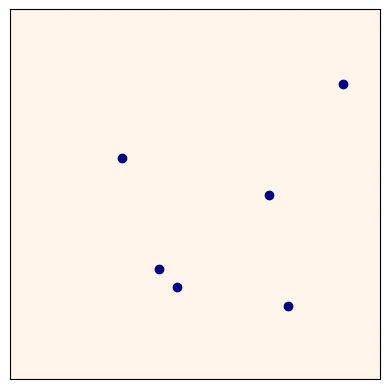

In [4]:
d = 2   # dimension of the data points
n = 6   # number of data points

y0 = torch.zeros((n,d), device=device)
y0[0, 0] = 0.9
y0[0, 1] = 0.2

y0[1, 0] = 0.75
y0[1, 1] = 0.8

y0[2, 0] = 0.3
y0[2, 1] = 0.4

y0[3, 0] = 0.4
y0[3, 1] = 0.7

y0[4, 0] = 0.45
y0[4, 1] = 0.75

y0[5, 0] = 0.7
y0[5, 1] = 0.5

#generate grid for plotting purpose
nr,nc = 256,256
extent = ((-0.5/nc, 1-0.5/nc, 1-0.5/nr, -0.5/nr))
xs = torch.linspace(0, 1, steps=nr)
ys = torch.linspace(0, 1, steps=nc)
xm, ym = torch.meshgrid(xs, ys, indexing='ij')
xm = xm.T
ym = ym.T
xgrid = torch.cat((xm.reshape(nr*nc,1),ym.reshape(nr*nc,1)),1).to(device)

plot_2D_data_points(np.zeros((nr,nc)), y0)

###### Second 2D dataset

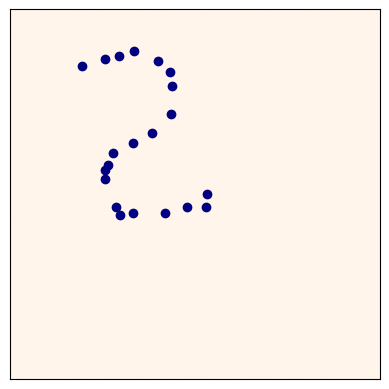

In [5]:
d = 2   # dimension of the data points
n = 21   # number of data points

y1 = torch.zeros((n,d), device=device)
y1[0, 0] = 0.194
y1[0, 1] = 0.15

y1[1, 0] = 0.256
y1[1, 1] = 0.132

y1[2, 0] = 0.334
y1[2, 1] = 0.11

y1[3, 0] = 0.398
y1[3, 1] = 0.138

y1[4, 0] = 0.436
y1[4, 1] = 0.206

y1[5, 0] = 0.434
y1[5, 1] = 0.282

y1[6, 0] = 0.382
y1[6, 1] = 0.332

y1[7, 0] = 0.278
y1[7, 1] = 0.386

y1[8, 0] = 0.256
y1[8, 1] = 0.458

y1[9, 0] = 0.284
y1[9, 1] = 0.532

y1[10, 0] = 0.332
y1[10, 1] = 0.55

y1[11, 0] = 0.418
y1[11, 1] = 0.55

y1[12, 0] = 0.476
y1[12, 1] = 0.532

y1[13, 0] = 0.528
y1[13, 1] = 0.532

y1[14, 0] = 0.332
y1[14, 1] = 0.36

y1[15, 0] = 0.53
y1[15, 1] = 0.498

y1[16, 0] = 0.294
y1[16, 1] = 0.124

y1[17, 0] = 0.262
y1[17, 1] = 0.418

y1[18, 0] = 0.254
y1[18, 1] = 0.432

y1[19, 0] = 0.43
y1[19, 1] = 0.168

y1[20, 0] = 0.296
y1[20, 1] = 0.554

plot_2D_data_points(np.zeros((nr,nc)), y1)

In [6]:
class DGAN(nn.Module):
    """
    Discriminator architecture of the GAN
    """
    def __init__(self, n_in, n_hid=10):
        super(DGAN, self).__init__()
        self.n_hid = n_hid
        self.n_in = n_in

        self.fc1 = nn.Linear(n_in, n_hid)
        self.fc2 = nn.Linear(n_hid, n_hid)
        self.fc3 = nn.Linear(n_hid, 1)

    def forward(self, x):
        y = nn.LeakyReLU(negative_slope=0.2)(self.fc1(x))
        y = nn.LeakyReLU(negative_slope=0.2)(self.fc2(y))
        #We apply sigmoid because the Discriminator should be in [0,1]
        y = nn.Sigmoid()(self.fc3(y))
        return y

In [7]:
class Generator_2D(nn.Module):
    """
    Generator architecture of the GAN
    """
    def __init__(self, n_in, n_out, n_hid=10, nlayers=3, device=torch.device("cpu")):
        super(Generator_2D, self).__init__()
        self.n_in = n_in
        self.n_out = n_out
        self.n_hid = n_hid
        self.nlayers = nlayers
        self.hidden = nn.ModuleList()

        for n in range(nlayers):
            n_in_t = n_in if n==0 else n_hid
            self.hidden.append(
                nn.Sequential(
                    nn.Linear(n_in_t, n_hid),
                    nn.ELU(1)
                ).to(device)
            )

        self.out = nn.Sequential(
            nn.Linear(n_hid, n_out),
            nn.Sigmoid()
        ).to(device)

        self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight, 1.0)
            if module.bias is not None:
                module.bias.data.zero_()

    def forward(self, x):
        for n in range(self.nlayers):
            x = self.hidden[n](x)
        x = self.out(x)
        return x

In [8]:
def GAN_discriminator_loss(D, G, y, z):
    return - ( torch.mean(torch.log(D(y))) + torch.mean(torch.log(1-D(G(z)))) )

def GAN_generator_loss(D, G, z):
    return torch.mean(torch.log(1 -D(G(z))))

In [9]:
def adversarial_training_2D(
        generator,
        discriminator,
        n_epochs,
        batch_size,
        niterD,
        niterG,
        lrG,
        lrD,
        beta_1,
        beta_2,
        n_in,
        y,
        loss = "gan",
        clip_value = 0.1,
        gradient_penalty_weight = 0.1):

    generator.train()
    discriminator.train()

    optimG = optim.Adam(generator.parameters(), lr=lrG)
    optimD = optim.Adam(discriminator.parameters(), lr=lrD, betas=(beta_1, beta_2))

    Glosses_per_epoch = []
    Dlosses_per_epoch = []
    Glosses_per_step = []
    Dlosses_per_step = []

    iter_display = 10

    # Main loop
    for epoch in range(1,n_epochs):
        ############################
        ### Train discriminator (niterD iterations)
        ############################
        for iter in range(0,niterD):
            optimD.zero_grad()
            z = torch.randn(batch_size, n_in, device=device)
            if loss == "gan":
                Dloss = GAN_discriminator_loss(discriminator, generator, y, z)
            elif loss == "wgan":
                Dloss = WGAN_discriminator_loss(discriminator, generator, y, z)
            elif loss == "wgan-gp":
                Dloss = WGAN_GP_discriminator_loss(discriminator, generator, y, z, gradient_penalty_weight=gradient_penalty_weight)
            else:
                print("Loss not recognized")
            Dloss.backward()
            optimD.step()

            if loss == "wgan":
                for param in discriminator.parameters():
                    param.data.clamp_(-clip_value, clip_value)

            Dlosst = Dloss.item()
            Dlosses_per_step.append(-Dlosst)

        ############################
        ### Train generator (niterG iterations)
        ############################
        for iter in range(0,niterG):
            optimG.zero_grad()
            z = torch.randn(batch_size, n_in, device=device)
            if loss == "gan":
                Gloss = GAN_generator_loss(discriminator, generator, z)
            elif loss == "wgan" or loss == "wgan-gp":
                Gloss = WGAN_generator_loss(discriminator, generator, z)
            else:
                print("Loss not recognized")
            Gloss.backward()
            optimG.step()

            Glosst = Gloss.item()
            Glosses_per_step.append(Glosst)

        Glosses_per_epoch.append(Gloss.item())
        Dlosses_per_epoch.append(-Dloss.item())

        if(epoch % iter_display == 0):
            # Output training stats
            print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f'% (epoch, n_epochs, Dloss.item(), Gloss.item()))
            #plot a generated sample
            Dxgrid = discriminator(xgrid).detach().cpu().numpy().reshape(nr,nc)
            z = torch.randn(batch_size, n_in, device=device)
            x = generator(z)
            xd = x.detach().squeeze(1)
            plot_2D_data_points(Dxgrid, y, xd, epoch)

    #Plot the evolution of the discriminator and generator losses #
    plt.figure(dpi=100)
    plt.plot(Dlosses_per_epoch,label='D')
    plt.plot(Glosses_per_epoch,label='G')
    plt.title('Loss evolution per epoch')
    plt.legend()
    plt.show()

    plt.figure(dpi=100)
    plt.plot(Dlosses_per_step,label='D')
    plt.title('Loss evolution per step')
    plt.legend()
    plt.show()

    plt.figure(dpi=100)
    plt.plot(Glosses_per_step,label='G', color='orange')
    plt.title('Loss evolution per step')
    plt.legend()
    plt.show()

In [10]:
## parameters for training
n_epochs = 100
niterD = 1000
niterG = 10

#generator optimizer parameters
lrG = 0.002   # learning rate for generator

#discriminator optimizer parameters
lrD = 0.002
beta_1 = 0.5
beta_2 = 0.999

n_in = 10 #latent space dimension
d = 2 #dimension of the data
batch_size = 100 #batch_size for the generation (sample new data by batch_size size)

[10/100] 	Loss_D: 1.2113	Loss_G: -0.9991


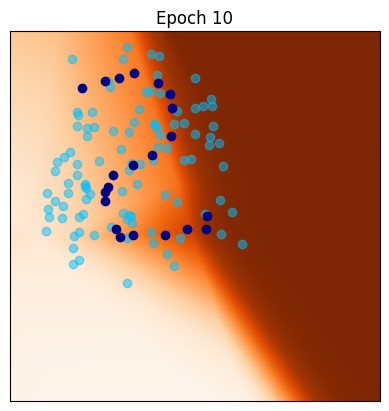

[20/100] 	Loss_D: 1.2828	Loss_G: -0.6749


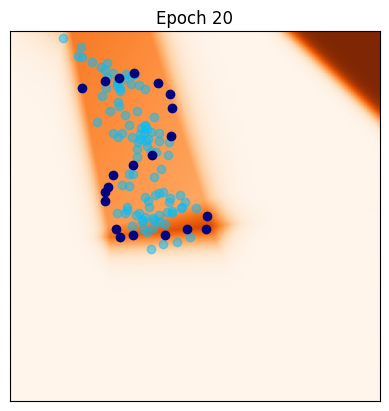

[30/100] 	Loss_D: 1.2595	Loss_G: -0.8858


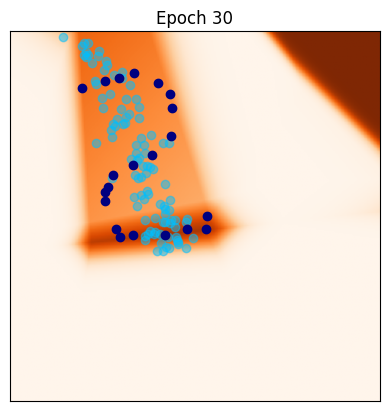

[40/100] 	Loss_D: 1.3477	Loss_G: -0.8291


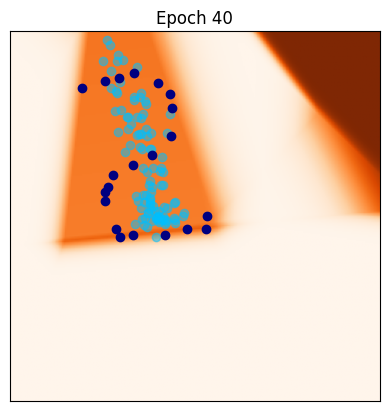

[50/100] 	Loss_D: 1.3318	Loss_G: -0.5909


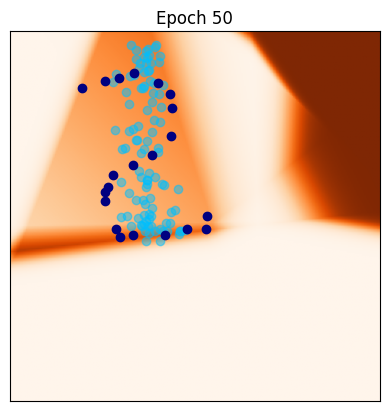

[60/100] 	Loss_D: 1.1821	Loss_G: -0.7731


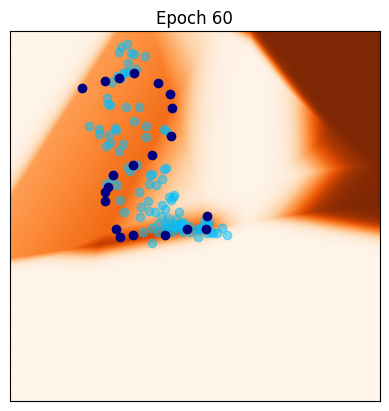

[70/100] 	Loss_D: 1.1703	Loss_G: -0.8838


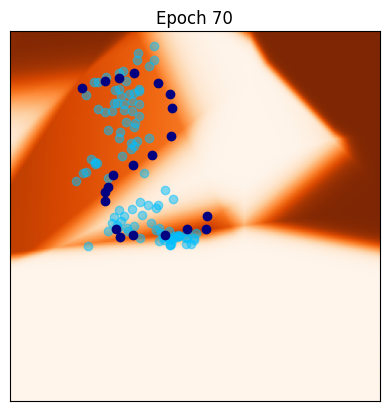

[80/100] 	Loss_D: 1.0065	Loss_G: -0.2429


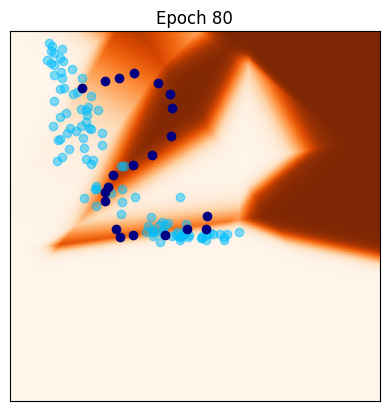

[90/100] 	Loss_D: 1.1404	Loss_G: -0.4629


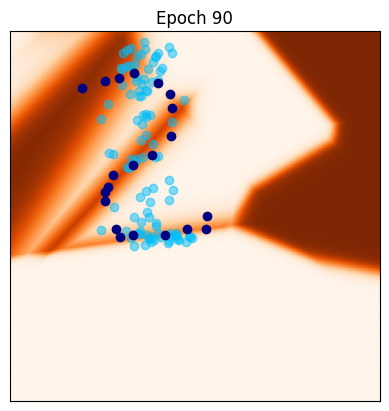

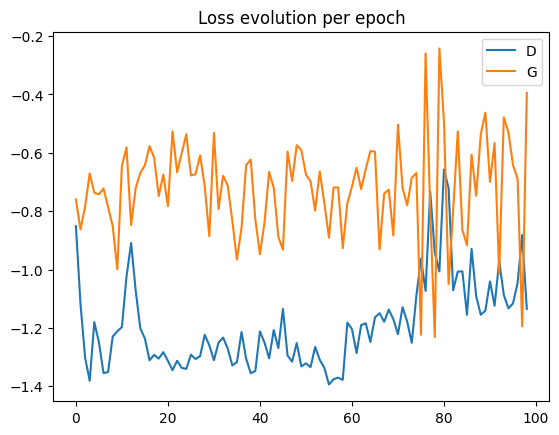

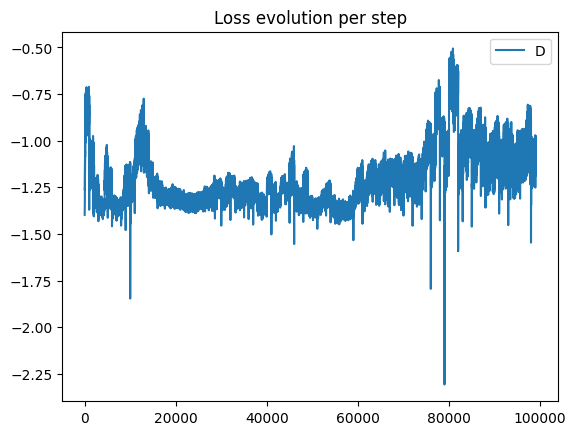

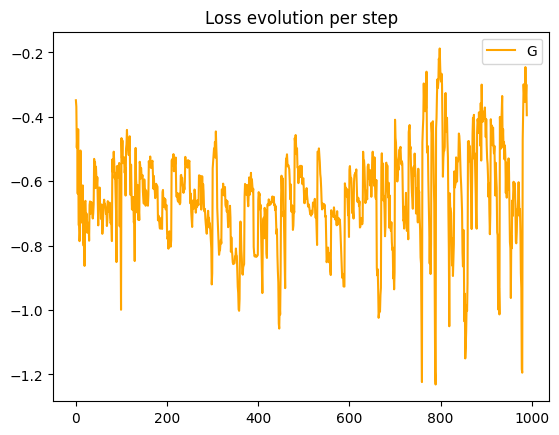

In [11]:
G_GAN = Generator_2D(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
D_GAN = DGAN(n_in=d, n_hid=10).to(device)

adversarial_training_2D(G_GAN, D_GAN, n_epochs, batch_size, niterD, niterG, lrG, lrD, beta_1, beta_2, n_in, y1, loss = "gan")

#### 1.a. Comment on the differences with respect to the WGAN learning algorithm.

- For the GAN algorithm, the loss is the following:
$$ \min_{\theta \in \Theta} \max_{D \in \mathcal{D}} \mathbb{E} \left[ \log D(Y) \right] + \mathbb{E} \left[ \log 1 - D(g_{\theta}(z))  \right]$$

    Therefore, the training algorithm alternates between:
    - Ascent step(s) on $D \mapsto  \mathbb{E} \left[ \log D(Y) \right] + \mathbb{E} \left[ \log 1 - D(g_{\theta}(z))  \right]$
    - Descent step(s) on $\theta \mapsto  \mathbb{E} \left[ \log 1 - D(g_{\theta}(z))  \right]$

    The output of the discriminator should be in [0,1] to respect the definition set of the $\log$ function.


- For the WGAN algorithm, the loss is the following:
$$ \min_{\theta \in \Theta} \max_{D \in \text{Lip}_1} \mathbb{E} \left[D(Y) \right] - \mathbb{E} \left[  D(g_{\theta}(z))  \right]$$

    Therefore, the training algorithm alternates between:
    - Ascent step(s) on $D \mapsto  \mathbb{E} \left[D(Y) \right] - \mathbb{E} \left[  D(g_{\theta}(z))  \right]$
    - Descent step(s) on $\theta \mapsto - \mathbb{E} \left[  D(g_{\theta}(z))  \right]$

    This time, the output of the discriminator is not restrained to be in [0,1], but can be in $\mathbb{R}$, as the $\log$ function disappeared.

On a finite sample, the GAN loss is called a binary-cross-entropy, where the discriminator tries to classify samples as real or generated. The WGAN loss is  based on the Wasserstein distance, which measures how much the data distribution must be changed to transform the generated distribution into the real one.

#### 1.b. Comment on the possible stability problems that you may encounter with the GAN algorithm.

GANs often suffer from vanishing gradients when the discriminator is close to 1, which leads to unstable training. WGAN addresses this by removing the sigmoid activation function in the discriminator. However, WGAN enforces a Lipschitz continuity constraint on the discriminator, which is implemented using weight clipping. Moreover, the generator can suffer from mode collapse on the MNIST dataset for example (it will always produce the same number) or here in this 2D case, it can generate points only around some specific training points. Finally, the adversarial nature between the generator and discriminator can lead to oscillations in loss, failure to convergence or even divergence. Indeed, we can observe that the discriminator loss is not clearly increasing at it should, there is the same observation for a decreasing generator loss.

### 2. For (2D-data), compute and display the three generative networks obtained with the algorithms based on GAN, WGAN and VAE. Answer the following questions:

In [12]:
def display_generated_samples(generator, y, generator_type = "adversarial"):
    if generator_type == "adversarial":
        latent_dim = generator.n_in
    elif generator_type == "vae":
        latent_dim = generator.latent_dim

    z = torch.randn(batch_size, latent_dim, device=device)
    if generator_type == "adversarial":
        x = generator(z)
    elif generator_type == "vae":
        x = generator.decode_mu(z)
    xd = x.detach().squeeze(1)
    plot_2D_data_points(torch.zeros(nr,nc), y, xd = xd)

##### GAN

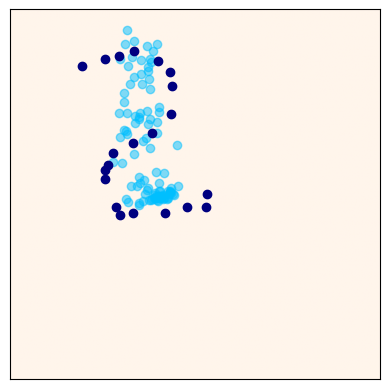

In [13]:
#Samples generation using the generator trained above
display_generated_samples(G_GAN, y1, generator_type = "adversarial")

##### WGAN

In [14]:
class DWGAN_2D(nn.Module):
    """
    Discriminator architecture of the WGAN
    """
    def __init__(self, n_in, n_hid=10):
        super(DWGAN_2D, self).__init__()

        self.n_hid = n_hid
        self.n_in = n_in

        self.fc1 = nn.Linear(n_in, n_hid)
        self.fc2 = nn.Linear(n_hid, n_hid)
        self.fc3 = nn.Linear(n_hid, 1)

    def forward(self, x):
        y = nn.LeakyReLU(negative_slope=0.2)(self.fc1(x))
        y = nn.LeakyReLU(negative_slope=0.2)(self.fc2(y))
        #We don't apply sigmoid because the Discriminator could be in R
        y = self.fc3(y)
        return y

In [15]:
def gradient_penalty(D,x,y, data_type = "2D"):
    # Calculate interpolation
    b = x.shape[0]
    n = y.shape[0]
    if data_type == "2D":
        alpha = torch.rand((b,n,1),device=device)
        interp = (alpha * y[None,:,:] + (1 - alpha) * x[:,None,:]).flatten(end_dim=1)
    elif data_type == "3D":
        alpha = torch.rand((b,1,1,1),device=device)
        interp = (alpha * y + (1 - alpha) * x)

    interp.requires_grad_()
    Di = D(interp).view(-1)

    gradients = torch.autograd.grad(
        outputs=Di,
        inputs=interp,
        grad_outputs=torch.ones(Di.size()).to(device),
        create_graph=True,
        retain_graph=True)[0]

    if data_type == "2D":
      gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim = 1))
    elif data_type == "3D":
      gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim = 1) + 1e-12) #avoid non differentiability in zero

    return torch.mean((gradients_norm - 1) ** 2)

In [16]:
def WGAN_discriminator_loss(D, G, y, z):
    return - torch.mean(D(y)) + torch.mean(D(G(z)))

def WGAN_GP_discriminator_loss(D, G, y, z, gradient_penalty_weight, data_type = "2D"):
    return - torch.mean(D(y)) + torch.mean(D(G(z))) + gradient_penalty_weight * gradient_penalty(D, G(z), y, data_type)

def WGAN_generator_loss(D, G, z):
    return - torch.mean(D(G(z)))

[10/100] 	Loss_D: -0.0097	Loss_G: 0.1045


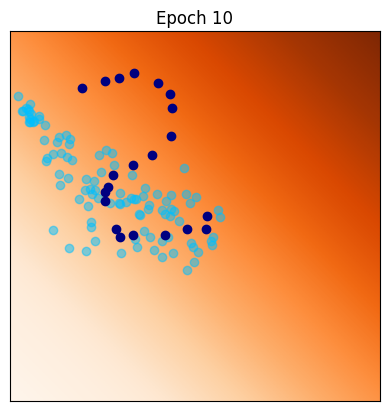

[20/100] 	Loss_D: 0.0004	Loss_G: 0.0614


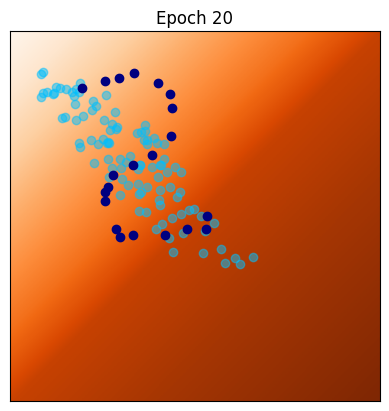

[30/100] 	Loss_D: -0.0078	Loss_G: 0.0418


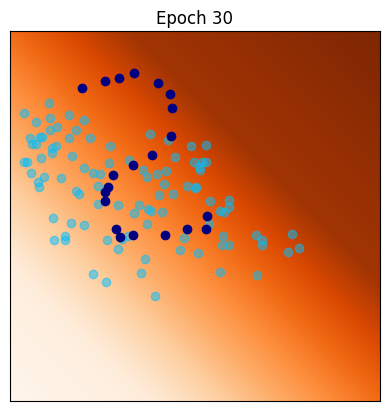

[40/100] 	Loss_D: -0.0044	Loss_G: 0.2644


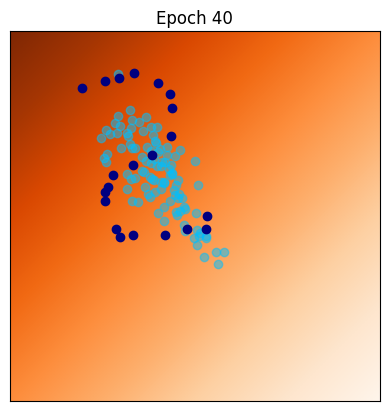

[50/100] 	Loss_D: -0.0056	Loss_G: 0.2238


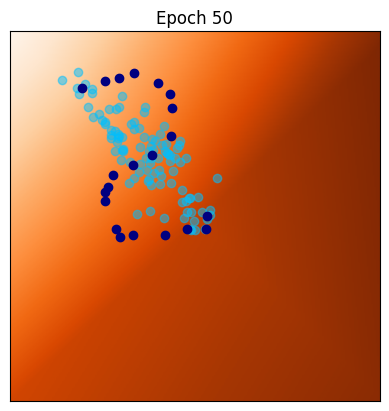

[60/100] 	Loss_D: -0.0027	Loss_G: 0.2714


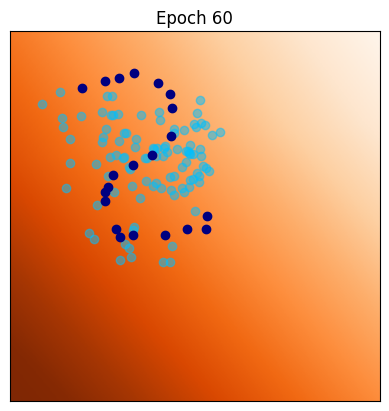

[70/100] 	Loss_D: -0.0027	Loss_G: 0.2546


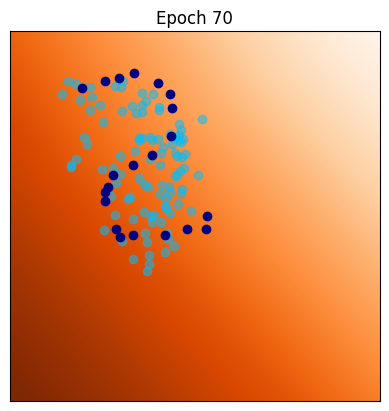

[80/100] 	Loss_D: -0.0005	Loss_G: 0.0724


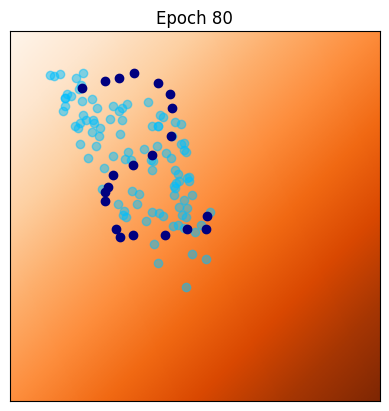

[90/100] 	Loss_D: -0.0003	Loss_G: 0.0761


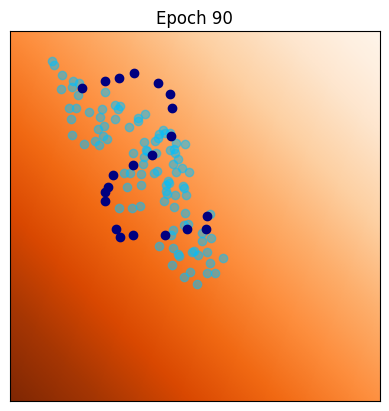

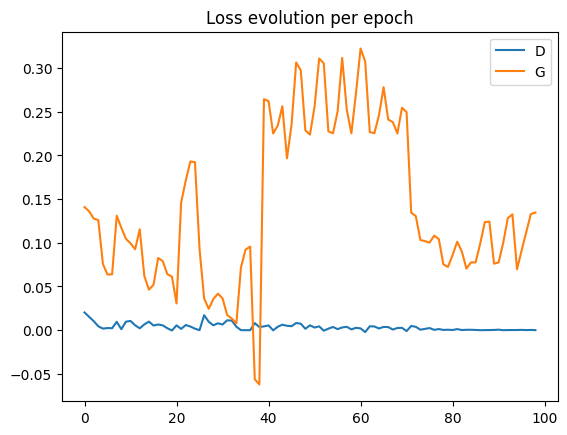

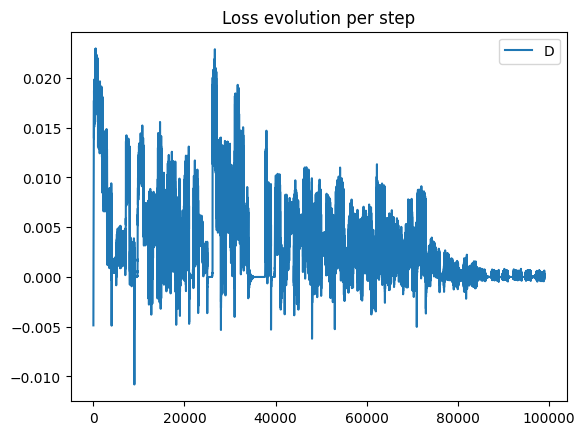

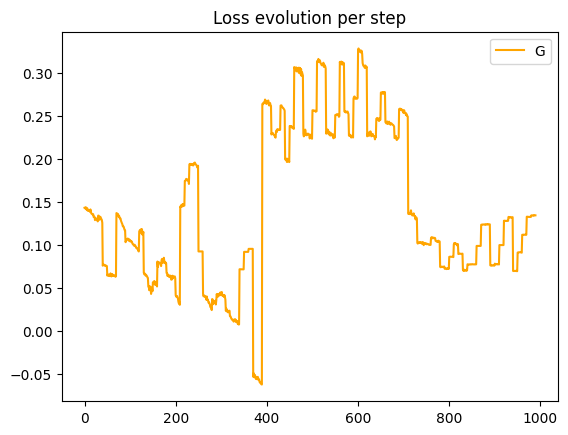

In [17]:
#training
G_WGAN = Generator_2D(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
D_WGAN = DWGAN_2D(n_in=d, n_hid=10).to(device)

adversarial_training_2D(G_WGAN, D_WGAN, n_epochs, batch_size, niterD, niterG, lrG, lrD, beta_1, beta_2, n_in, y1, loss = "wgan", clip_value=0.1)

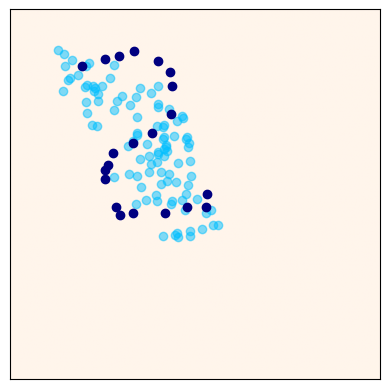

In [18]:
#samples generation with the generator trained above
display_generated_samples(G_WGAN, y1, generator_type = "adversarial")

[10/100] 	Loss_D: -0.0516	Loss_G: -0.9190


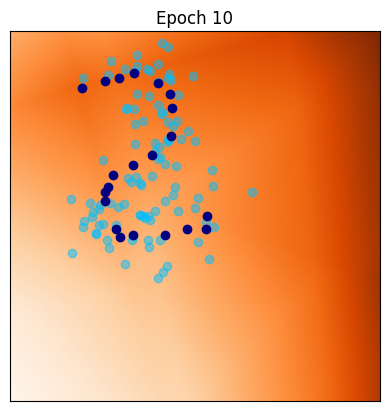

[20/100] 	Loss_D: -0.0536	Loss_G: -2.0519


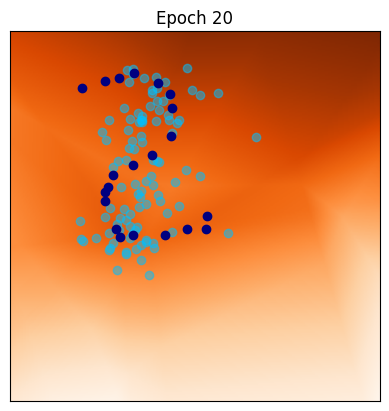

[30/100] 	Loss_D: -0.0446	Loss_G: -3.3702


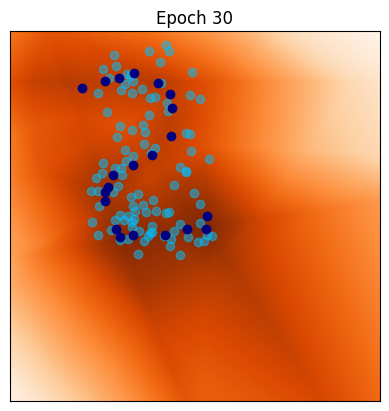

[40/100] 	Loss_D: -0.0437	Loss_G: -6.5929


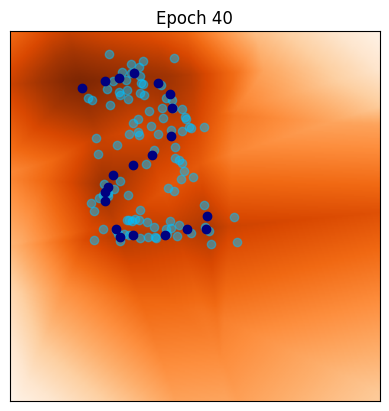

[50/100] 	Loss_D: -0.0513	Loss_G: -11.0220


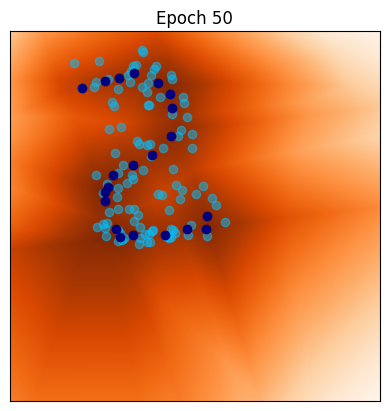

[60/100] 	Loss_D: -0.0412	Loss_G: -16.4819


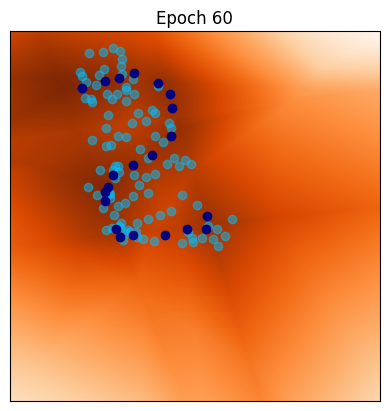

[70/100] 	Loss_D: -0.0518	Loss_G: -26.9375


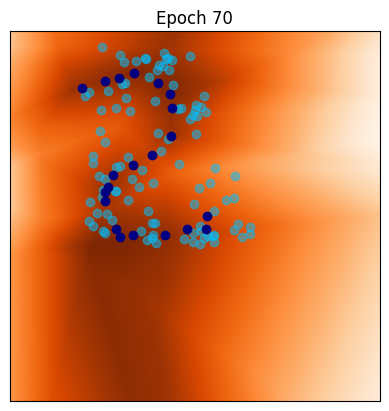

[80/100] 	Loss_D: -0.0437	Loss_G: -30.1256


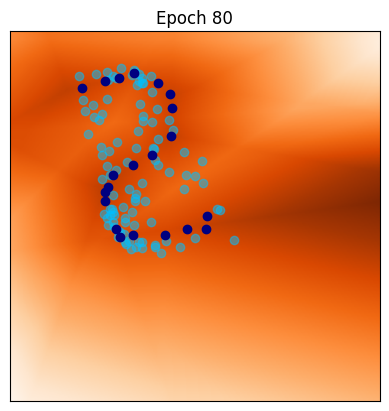

[90/100] 	Loss_D: -0.0138	Loss_G: -0.3302


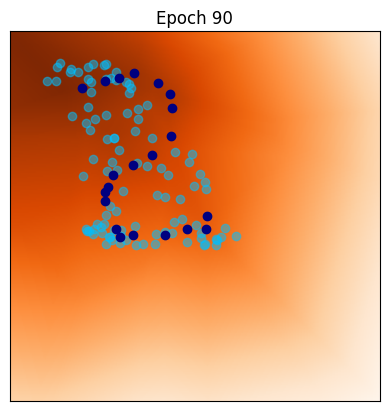

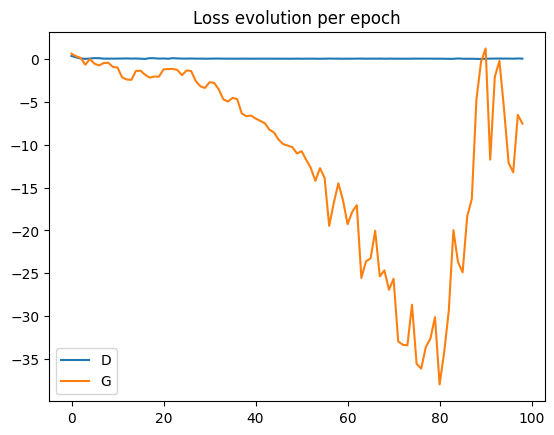

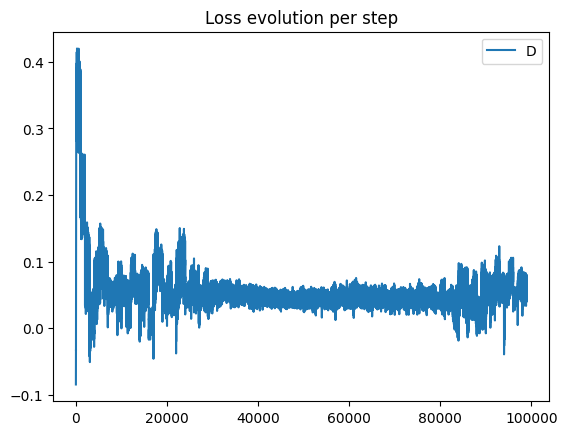

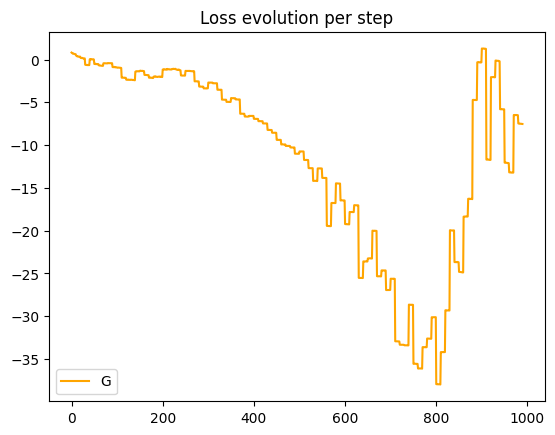

In [19]:
#training with gradient penalty instead of gradient clipping
G_WGAN_GP = Generator_2D(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
D_WGAN_GP = DWGAN_2D(n_in=d, n_hid=10).to(device)

#It can take several minutes to train (9 minutes on my computer with mps device)
adversarial_training_2D(G_WGAN_GP, D_WGAN_GP, n_epochs, batch_size, niterD, niterG, lrG, lrD, beta_1, beta_2, n_in, y1, loss = "wgan-gp", gradient_penalty_weight=0.1)

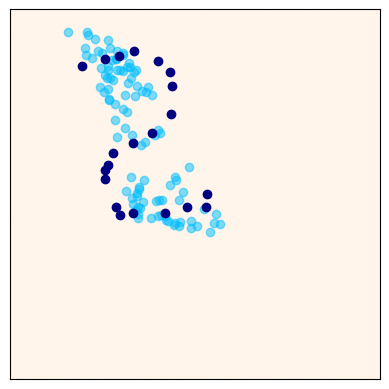

In [20]:
#samples generation with the generator trained above
display_generated_samples(G_WGAN_GP, y1, generator_type = "adversarial")

##### VAE

In [21]:
#Encoder
class Encoder_2D(nn.Module):
    """
    Encoder architecture for the VAE
    """
    def __init__(self, n_in, n_out, device=torch.device("cpu")):
        super(Encoder_2D, self).__init__()
        self.n_in = n_in
        self.layers = nn.Sequential(
            nn.Linear(n_in, n_out),
            nn.ReLU()
        ).to(device)

    def forward(self, x):
        x = self.layers(x)
        return x

In [22]:
#Encoder
class Decoder_2D(nn.Module):
    """
    Encoder architecture for the VAE
    """
    def __init__(self, latent_dim, output_dim_enc, output_dim, device=torch.device("cpu")):
        super(Decoder_2D, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(latent_dim, output_dim_enc),
            nn.ReLU(),
            nn.Linear(output_dim_enc, output_dim),
            nn.Sigmoid()
        ).to(device)

    def forward(self, x):
        x = self.layers(x)
        return x

In [23]:
#Variational Autoencoder
class VariationalAutoEncoder(nn.Module):
    def __init__(self, encoder, decoder, output_dim_enc, latent_dim):
        super(VariationalAutoEncoder, self).__init__()
        self.latent_dim = latent_dim
        self.n_in = encoder.n_in
        self.encoder = encoder
        self.fc_mu = nn.Linear(output_dim_enc, latent_dim)
        self.fc_logvar = nn.Linear(output_dim_enc, latent_dim)
        self.decoder = decoder

    def forward(self, input):
        x_encoder = self.encoder(input)
        mu = self.fc_mu(x_encoder)
        logvar = self.fc_logvar(x_encoder)
        z = self.reparameterize(mu, logvar)
        output = self.decoder(z)
        return output, mu, logvar

    def reparameterize(self, mu, logvar, eps_scale=1.):
        if self.training:
            std = logvar.mul(0.5).exp_()
            eps = torch.randn_like(std) * eps_scale
            return eps.mul(std).add_(mu)
        else:
            return mu

    def decode_mu(self, mu):
       output = self.decoder(mu)
       return output

    def loss_function(self, input, recon_input, mu, logvar, beta=0.05):
        recon = F.mse_loss(recon_input, input, reduction='mean')
        kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        loss = recon + beta*kld

        return loss, recon, kld

In [24]:
def vae_training(VAE, n_epochs, lr, train_loader, beta = 0.05, iter_display = 10):
    input_dimension = VAE.n_in
    optimizer = optim.Adam(VAE.parameters(), lr=lr)
    loss_list = []
    recon_list = []
    kld_list = []

    for epoch in range(1, n_epochs+1):
        VAE.train()
        train_loss_all = 0
        train_loss_all_recon = 0
        train_loss_all_kld = 0
        cnt_train=0

        for data in train_loader:
            if input_dimension == 2:
                data = data.to(device)
            elif input_dimension == 28*28:
                data = data[0].view(-1, 784).to(device)
            optimizer.zero_grad()
            recon_y, mu, logvar = VAE.forward(data)
            loss, recon, kld  = VAE.loss_function(data, recon_y, mu, logvar, beta = beta)

            train_loss_all_recon += recon.item()
            train_loss_all_kld += kld.item()
            cnt_train+=1

            loss.backward()
            train_loss_all += loss.item()
            optimizer.step()

        loss_list.append(train_loss_all/cnt_train)
        recon_list.append(train_loss_all_recon/cnt_train)
        kld_list.append(beta * train_loss_all_kld/cnt_train)

        if epoch % iter_display == 0:
            print('Epoch: {:04d}, Train Loss: {:.5f}, Train Reconstruction Loss: {:.5f}, Train KLD Loss: {:.5f}'.format(epoch, train_loss_all/cnt_train, train_loss_all_recon/cnt_train, train_loss_all_kld/cnt_train))
            VAE.eval()
            z = torch.randn(batch_size, VAE.latent_dim, device=device)
            x = VAE.decode_mu(z)
            xd = x.detach().squeeze(1)
            if input_dimension == 2:
              plot_2D_data_points(torch.zeros(nr,nc), next(iter(train_loader)), xd, epoch)
            else:
              xd = xd.view(-1, 1, 28, 28)
              pil_img = transforms.functional.to_pil_image(make_grid(xd.to('cpu'),nrow=16))
              display(pil_img)

    #plot losses
    plt.figure(dpi=100)
    plt.plot(loss_list,label='loss')
    plt.plot(recon_list,label='reconstruction loss')
    plt.plot(kld_list,label='kl-divergence loss')
    plt.title('Loss evolution per epoch')
    plt.legend()
    plt.show()

Epoch: 1000, Train Loss: 0.00090, Train Reconstruction Loss: 0.00032, Train KLD Loss: 579.65424


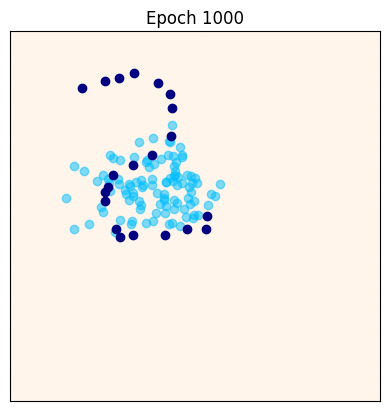

Epoch: 2000, Train Loss: 0.00051, Train Reconstruction Loss: 0.00015, Train KLD Loss: 353.16278


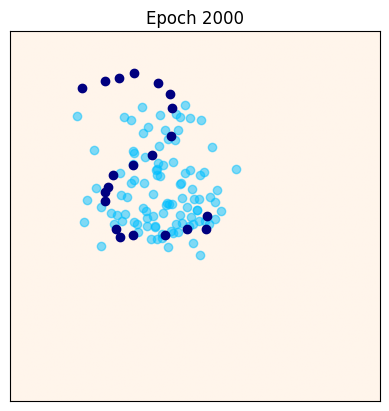

Epoch: 3000, Train Loss: 0.00036, Train Reconstruction Loss: 0.00009, Train KLD Loss: 270.54880


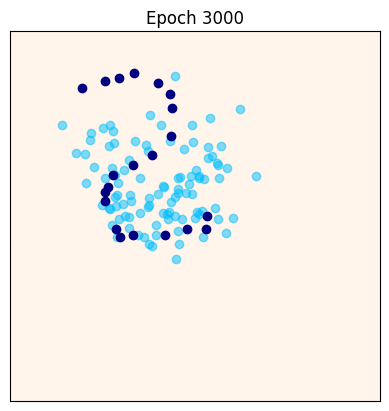

Epoch: 4000, Train Loss: 0.00023, Train Reconstruction Loss: 0.00005, Train KLD Loss: 176.32639


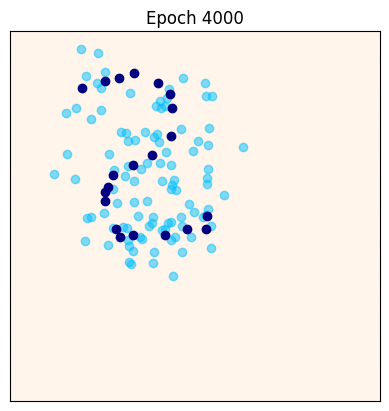

Epoch: 5000, Train Loss: 0.00020, Train Reconstruction Loss: 0.00005, Train KLD Loss: 152.02917


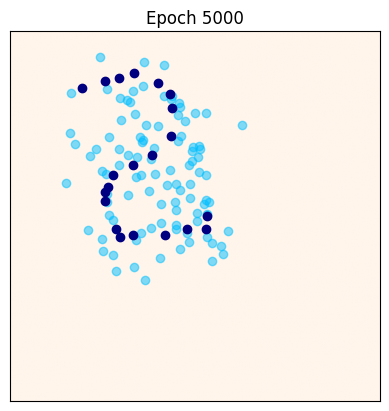

Epoch: 6000, Train Loss: 0.00020, Train Reconstruction Loss: 0.00005, Train KLD Loss: 143.70811


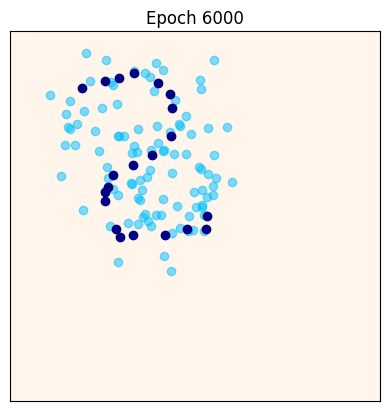

Epoch: 7000, Train Loss: 0.00017, Train Reconstruction Loss: 0.00003, Train KLD Loss: 140.30077


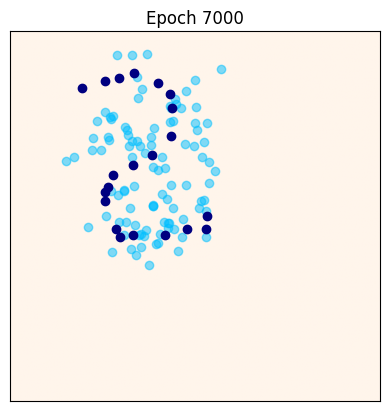

Epoch: 8000, Train Loss: 0.00017, Train Reconstruction Loss: 0.00003, Train KLD Loss: 137.65822


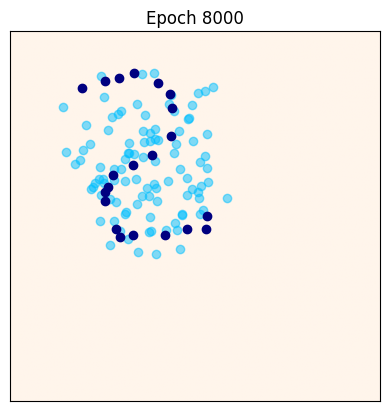

Epoch: 9000, Train Loss: 0.00016, Train Reconstruction Loss: 0.00003, Train KLD Loss: 134.52707


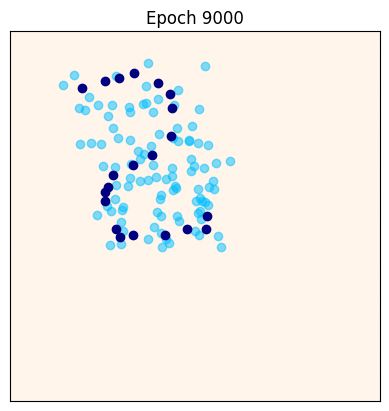

Epoch: 10000, Train Loss: 0.00017, Train Reconstruction Loss: 0.00004, Train KLD Loss: 135.92973


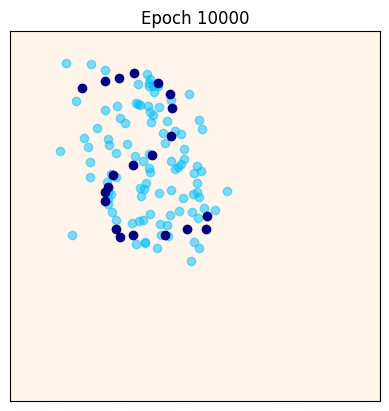

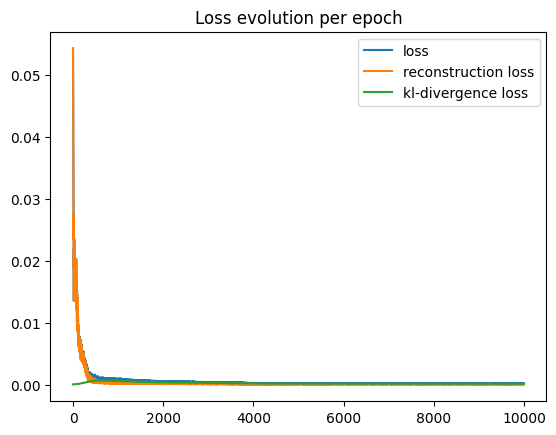

In [25]:
train_loader = DataLoader(y1, batch_size=len(y1))

output_dim_enc = 32
latent_dim = 32
output_dim = 2

encoder = Encoder_2D(output_dim, output_dim_enc, device=device)
decoder = Decoder_2D(latent_dim, output_dim_enc, output_dim, device=device)
VAE_2D = VariationalAutoEncoder(encoder, decoder, output_dim_enc, latent_dim).to(device)

n_epochs = 10000
lr = 0.002
beta = 1e-6

vae_training(VAE_2D, n_epochs, lr, train_loader, beta, iter_display = 1000)

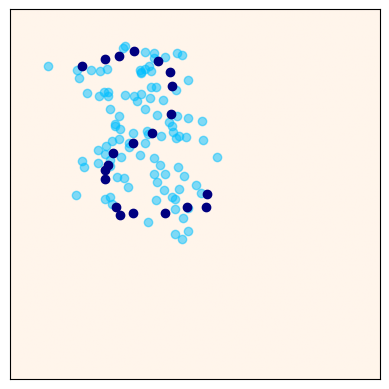

In [26]:
display_generated_samples(VAE_2D, y1, generator_type = "vae")

#### 2.a. Comment on the possible difficulties encountered in the adjustment of the parameters of the learning algorithm.

Tuning the learning rate, batch size, number of epochs, number of Generator/Discriminator training steps in one epoch and architectural choices like the number of layers or neurons can greatly impact results (the architecture is about the Generator and Discriminator for the GAN and WGAN / the encoder and decoder for the VAE). For WGAN the clipping value is also a hyperparameter to tune, if it's not well done, it can lead to suboptimal solutions. It's the same for the gradient penalty weight for WGAN-GP.

VAEs typically face less instability but are sensitive to the trade-off between reconstruction loss and the KL divergence term in the loss function. The balancing parameter $\beta$ can affect the quality of generated samples and their diversity.

#### 2.b. Comment on the obtained configurations of generative networks: Is the data distribution well covered? Are the data points well interpolated?... (Here, we only expect some qualitative comments. You are not expected to perform precise quantitative evaluation in this question.)

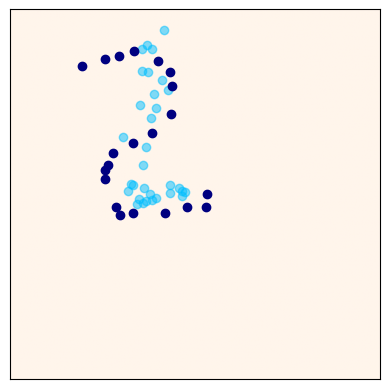

In [60]:
#GAN
display_generated_samples(G_GAN, y1, generator_type = "adversarial")

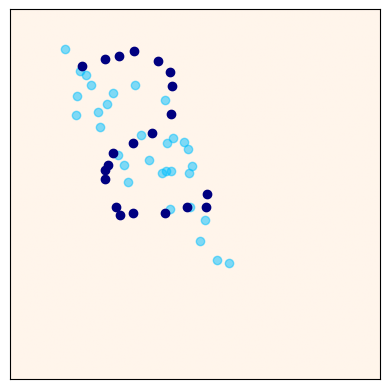

In [55]:
#WGAN weight clipping
display_generated_samples(G_WGAN, y1, generator_type = "adversarial")

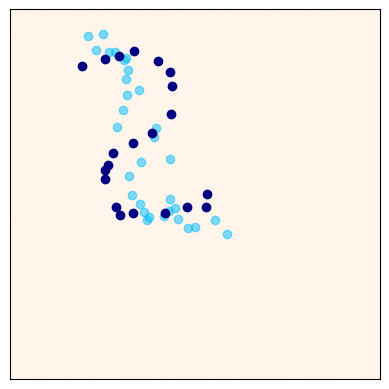

In [64]:
#WGAN gradient penalty
display_generated_samples(G_WGAN_GP, y1, generator_type = "adversarial")

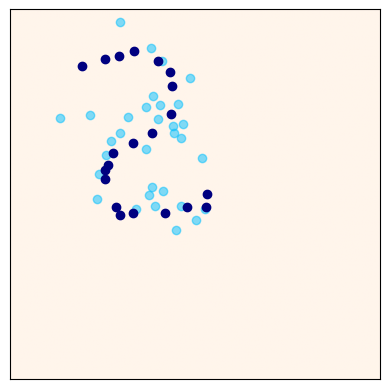

In [45]:
#VAE
display_generated_samples(VAE_2D, y1, generator_type = "vae")

For the GAN, the generated samples follows more or less the curve of the data distibution. The data distribution is rather well covered, and therefore points are rather well interpolated too.

For the WGAN-WC, the region from the training data distribution is more or less covered. However the points are badly interpolated, they tend to be on a line, which doesn't corresponds to the training data distribution which can be seen as a '2'.

For the WGAN-GP, the region from the training data distribution is better covered than for WGAN-WC, this is quite good. Unfortunately, the points are interpolated but not so good as for GAN: sometimes we cannot distinguish a '2' or very hardly.

For the VAE, the region from the training data distribution is well covered. However, the data points are not well interpolated: we cannot observe a '2' very well.

### 3. For (MNIST-data), compute and compare the two generative networks obtained with the algorithms based on WGAN, and VAE.

In [31]:
# Displaying images
def imshow(img,size=None):
    img = img*0.5 + 0.5     #unnormalize
    if size is not None:
      img = transforms.Resize(size=size, interpolation=transforms.InterpolationMode.NEAREST, antialias=True)(img)
    pil_img = transforms.functional.to_pil_image(img)
    display(pil_img)
    return None

#function to display samples of the generator
def show(G,z=None,batch_size=128,nz=100):
  # provide random latent code as option to see evolution
  with torch.no_grad():
    if z==None:
      z = torch.randn(batch_size,nz,1,1).to(device)
    genimages = G(z)
    pil_img = imshow(make_grid(genimages.to('cpu'),nrow=16))
    return(pil_img)

In [32]:
batch_size=128
transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5,), (0.5,))])
train_set_MNIST = MNIST(os.getcwd(), train=True, transform=transform, download=True)

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 9.91M/9.91M [00:02<00:00, 4.71MB/s]


Extracting /content/MNIST/raw/train-images-idx3-ubyte.gz to /content/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 28.9k/28.9k [00:00<00:00, 133kB/s]


Extracting /content/MNIST/raw/train-labels-idx1-ubyte.gz to /content/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 1.65M/1.65M [00:01<00:00, 1.26MB/s]


Extracting /content/MNIST/raw/t10k-images-idx3-ubyte.gz to /content/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 4.54k/4.54k [00:00<00:00, 11.1MB/s]

Extracting /content/MNIST/raw/t10k-labels-idx1-ubyte.gz to /content/MNIST/raw



##### WGAN

In [33]:
class Generator_3D(nn.Module):
    def __init__(self, nz, ngf):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(in_channels = nz, out_channels = ngf * 8, kernel_size = 4, stride = 1, padding = 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(in_channels = ngf * 8, out_channels = ngf * 4, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(in_channels = ngf * 4, out_channels = ngf * 2, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(in_channels = ngf * 2, out_channels = ngf, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(in_channels = ngf, out_channels = 1, kernel_size=1, stride=1, padding=2, bias=False),
            nn.Tanh()
            # output size. 1 x 28 x 28
        )

        self.apply(self.init_weights)

    def init_weights(self, module):
        classname = module.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(module.weight.data, 0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(module.weight.data, 1.0, 0.02)
            nn.init.constant_(module.bias.data, 0)

    def forward(self, input):
        return self.main(input)

In [34]:
class DWGAN_3D(nn.Module):
    def __init__(self, ndf):
        super().__init__()
        self.main = nn.Sequential(
            # input is 1 x 28 x 28
            nn.Conv2d(in_channels = 1, out_channels = ndf, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 15 x 15
            nn.Conv2d(in_channels = ndf, out_channels= ndf * 2, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 8 x 8
            nn.Conv2d(in_channels = ndf * 2, out_channels = ndf * 4, kernel_size = 4, stride = 2, padding = 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 5 x 5
            nn.Conv2d(in_channels = ndf * 4, out_channels = 1, kernel_size = 4, stride = 2, padding = 1, bias=False)
        )

        self.apply(self.init_weights)

    def init_weights(self, module):
        classname = module.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(module.weight.data, 0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(module.weight.data, 1.0, 0.02)
            nn.init.constant_(module.bias.data, 0)

    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)

In [35]:
def adversarial_training_3D(
        generator,
        discriminator,
        n_epochs,
        lrG,
        lrD,
        niterD,
        niterG,
        beta1,
        beta2,
        train_loader,
        batch_size,
        nz,
        loss = "wgan-gp",
        clip_value = 0.1,
        gradient_penalty_weight = 0.1):

    optimizerD = optim.Adam(discriminator.parameters(), lr=lrD, betas=(beta1, beta2))
    optimizerG = optim.Adam(generator.parameters(), lr=lrG, betas=(beta1, beta2))

    Glosses_per_epoch = []
    Dlosses_per_epoch = []
    Glosses_per_step = []
    Dlosses_per_step = []

    iter_display = 100

    z_vizualization = torch.randn(batch_size, nz, 1, 1).to(device)

    t0 = time.time()
    for epoch in range(n_epochs):
        for i, batch in enumerate(train_loader, 0):
            ############################
            # Draw Batches of real and fake images
            real,_ = batch
            y = real.to(device)
            b = y.shape[0]

            ############################
            ### Train discriminator (niterD iterations)
            ############################
            for iter in range(0,niterD):
                optimizerD.zero_grad()
                z = torch.randn(b, nz, 1, 1).to(device)
                if loss == "wgan":
                    Dloss = WGAN_discriminator_loss(discriminator, generator, y, z)
                elif loss == "wgan-gp":
                    Dloss = WGAN_GP_discriminator_loss(discriminator, generator, y, z, gradient_penalty_weight=gradient_penalty_weight, data_type = "3D")
                else:
                    print("Loss not recognized")
                Dloss.backward()
                optimizerD.step()

                if loss == "wgan":
                    for param in discriminator.parameters():
                        param.data.clamp_(-clip_value, clip_value)

                Dlosst = Dloss.item()
                Dlosses_per_step.append(-Dlosst)


            ############################
            ### Train generator (niterG iterations)
            ############################
            for iter in range(0,niterG):
                optimizerG.zero_grad()
                z = torch.randn(b, nz, 1, 1).to(device)
                if loss == "wgan" or loss == "wgan-gp":
                    Gloss = WGAN_generator_loss(discriminator, generator, z)
                else:
                    print("Loss not recognized")
                Gloss.backward()
                optimizerG.step()

                Glosst = Gloss.item()
                Glosses_per_step.append(Glosst)

            #Store losses
            Glosses_per_epoch.append(Gloss.item())
            Dlosses_per_epoch.append(-Dloss.item())
            ############################
            # Display training stats and visualize
            if i % iter_display == 0:
                print('[%d/%d][%d/%d][%.4f s]\tLoss_D: %.4f\tLoss_G: %.4f'% (epoch+1, n_epochs, i, len(train_loader), time.time()-t0, Dloss.item(), Gloss.item()))
                show(generator, z_vizualization, batch_size)

    #Plot the evolution of the discriminator and generator losses #
    plt.figure(dpi=100)
    plt.plot(Dlosses_per_epoch,label='D')
    plt.plot(Glosses_per_epoch,label='G')
    plt.title('Loss evolution per epoch')
    plt.legend()
    plt.show()

    plt.figure(dpi=100)
    plt.plot(Dlosses_per_step,label='D')
    plt.title('Loss evolution per step')
    plt.legend()
    plt.show()

    plt.figure(dpi=100)
    plt.plot(Glosses_per_step,label='G', color='orange')
    plt.title('Loss evolution per step')
    plt.legend()
    plt.show()

In [36]:
n_epochs = 5
iter_display = 100
gradient_penalty_weight = 0.1
clip_value = 0.1

nz = 100 #dimension of the latent space
ngf = 64 #size of feature maps in generator
ndf = 64 #size of feature maps in discriminator

lrG = 0.0002
niterG = 1
lrD = 0.0002
niterD = 1
beta1 = 0.5
beta2 = 0.999

batch_size = 32 #batch_size for the generation of new samples process

[1/5][0/1875][1.0667 s]	Loss_D: 0.5559	Loss_G: 1.0056


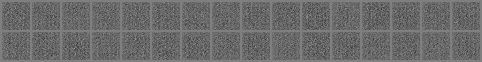

[1/5][100/1875][5.3315 s]	Loss_D: -8.5173	Loss_G: 7.9080


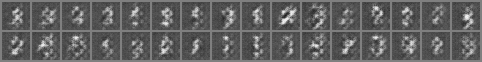

[1/5][200/1875][9.5129 s]	Loss_D: -34.0207	Loss_G: 28.8144


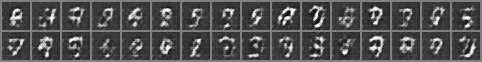

[1/5][300/1875][13.9641 s]	Loss_D: -64.3059	Loss_G: 58.5826


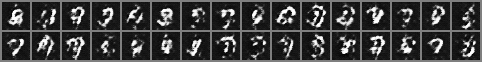

[1/5][400/1875][18.1985 s]	Loss_D: -77.1385	Loss_G: 23.5614


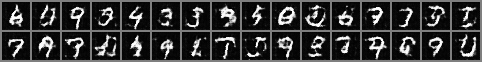

[1/5][500/1875][22.4846 s]	Loss_D: -43.5124	Loss_G: 34.0800


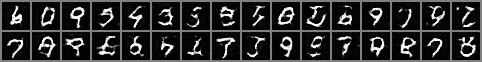

[1/5][600/1875][26.8151 s]	Loss_D: -45.8426	Loss_G: 41.2254


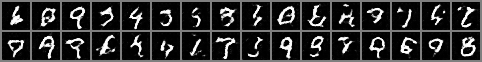

[1/5][700/1875][30.9550 s]	Loss_D: -32.3459	Loss_G: 46.8281


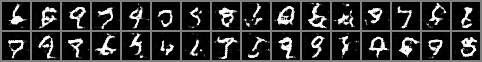

[1/5][800/1875][35.1230 s]	Loss_D: -22.0503	Loss_G: 24.9186


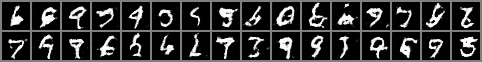

[1/5][900/1875][39.3791 s]	Loss_D: -78.0726	Loss_G: 56.1804


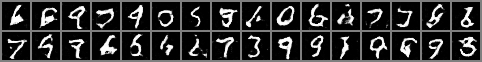

[1/5][1000/1875][43.4830 s]	Loss_D: 7.0376	Loss_G: -8.9166


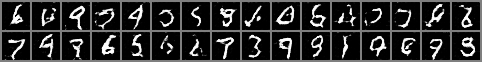

[1/5][1100/1875][47.7064 s]	Loss_D: -18.9249	Loss_G: -128.9087


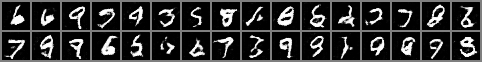

[1/5][1200/1875][51.8915 s]	Loss_D: -36.1523	Loss_G: -18.8933


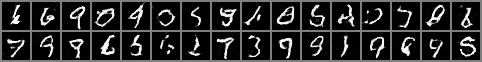

[1/5][1300/1875][55.9544 s]	Loss_D: -75.0345	Loss_G: 91.1922


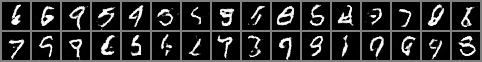

[1/5][1400/1875][60.2402 s]	Loss_D: 52.8011	Loss_G: 27.4285


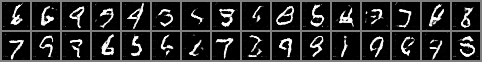

[1/5][1500/1875][64.3780 s]	Loss_D: -73.8351	Loss_G: 109.5524


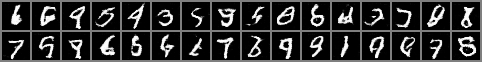

[1/5][1600/1875][68.4474 s]	Loss_D: 9.8367	Loss_G: 73.3384


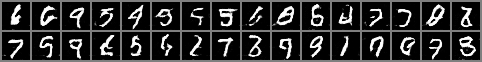

[1/5][1700/1875][72.7717 s]	Loss_D: 34.4822	Loss_G: 36.7891


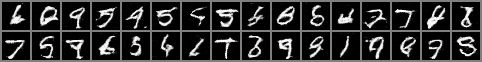

[1/5][1800/1875][76.8696 s]	Loss_D: -46.2751	Loss_G: 81.3813


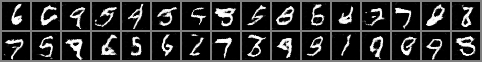

[2/5][0/1875][80.0522 s]	Loss_D: -51.3350	Loss_G: 33.0080


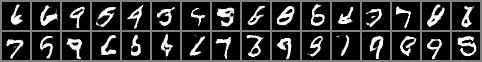

[2/5][100/1875][84.3614 s]	Loss_D: -57.7222	Loss_G: 18.0535


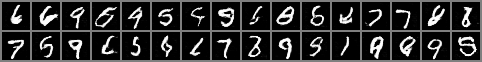

[2/5][200/1875][88.5131 s]	Loss_D: -7.6246	Loss_G: -64.1525


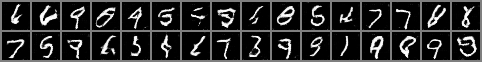

[2/5][300/1875][92.6148 s]	Loss_D: -19.4562	Loss_G: 32.8463


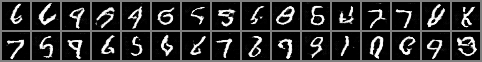

[2/5][400/1875][96.9607 s]	Loss_D: 23.3037	Loss_G: 48.2176


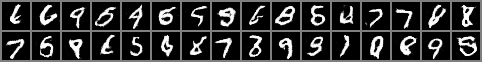

[2/5][500/1875][101.0987 s]	Loss_D: -68.3068	Loss_G: 189.3450


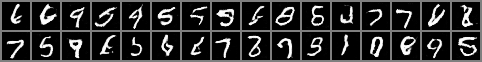

[2/5][600/1875][105.2168 s]	Loss_D: -33.4189	Loss_G: 96.5561


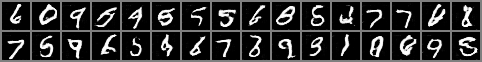

[2/5][700/1875][109.5633 s]	Loss_D: -63.6732	Loss_G: 61.3138


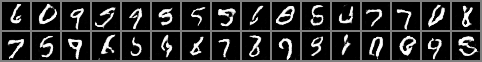

[2/5][800/1875][113.6409 s]	Loss_D: -36.0482	Loss_G: 52.4449


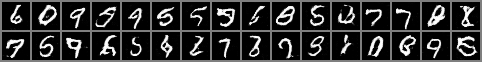

[2/5][900/1875][117.7182 s]	Loss_D: -13.2058	Loss_G: 118.1646


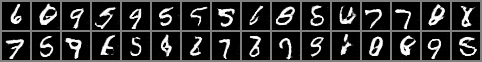

[2/5][1000/1875][122.1026 s]	Loss_D: -176.8645	Loss_G: 72.2528


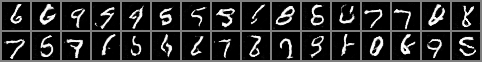

[2/5][1100/1875][126.2313 s]	Loss_D: -38.2084	Loss_G: 136.9585


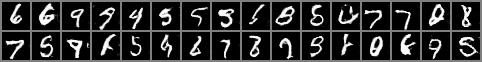

[2/5][1200/1875][130.3321 s]	Loss_D: -117.9573	Loss_G: 105.9911


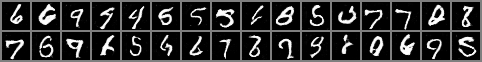

[2/5][1300/1875][134.6655 s]	Loss_D: -14.1577	Loss_G: -20.5261


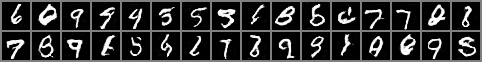

[2/5][1400/1875][138.7638 s]	Loss_D: -27.1162	Loss_G: 76.7295


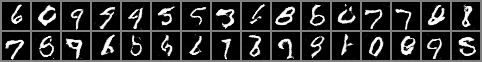

[2/5][1500/1875][142.8625 s]	Loss_D: -76.1724	Loss_G: 134.0152


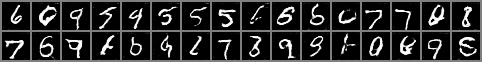

[2/5][1600/1875][147.1661 s]	Loss_D: -52.2275	Loss_G: 68.0815


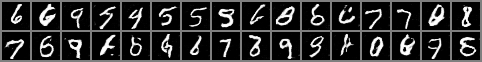

[2/5][1700/1875][151.2460 s]	Loss_D: -29.5235	Loss_G: 175.9036


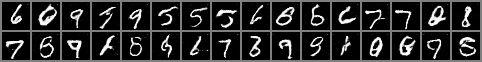

[2/5][1800/1875][155.3645 s]	Loss_D: 15.3605	Loss_G: 151.3253


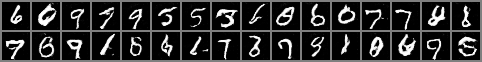

[3/5][0/1875][158.7828 s]	Loss_D: -28.1110	Loss_G: 149.1683


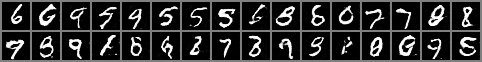

[3/5][100/1875][162.8952 s]	Loss_D: -39.9792	Loss_G: 152.2122


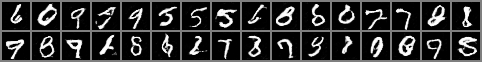

[3/5][200/1875][167.0230 s]	Loss_D: -62.0048	Loss_G: 104.4707


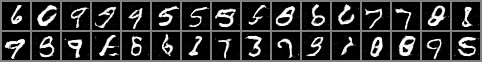

[3/5][300/1875][171.3596 s]	Loss_D: -37.1157	Loss_G: 81.3751


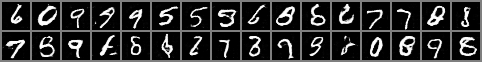

[3/5][400/1875][175.4705 s]	Loss_D: 30.9360	Loss_G: 214.8826


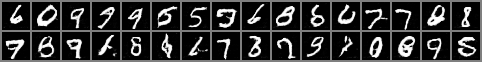

[3/5][500/1875][179.6006 s]	Loss_D: -39.2147	Loss_G: 171.6127


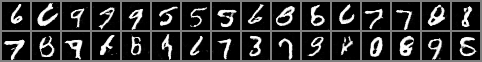

[3/5][600/1875][183.9393 s]	Loss_D: 5.3428	Loss_G: 124.1789


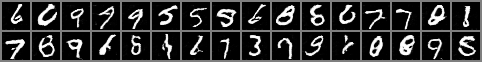

[3/5][700/1875][188.0604 s]	Loss_D: -71.2775	Loss_G: 267.0127


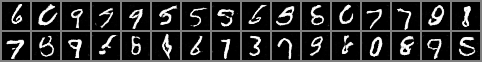

[3/5][800/1875][192.1604 s]	Loss_D: -40.5720	Loss_G: 94.9399


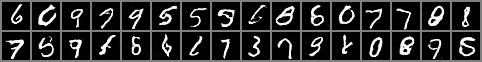

[3/5][900/1875][196.4670 s]	Loss_D: -43.0271	Loss_G: -9.5891


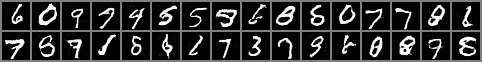

[3/5][1000/1875][200.5820 s]	Loss_D: -75.2422	Loss_G: 174.1181


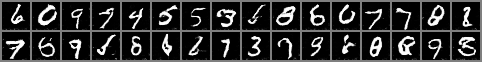

[3/5][1100/1875][204.7616 s]	Loss_D: -56.5339	Loss_G: 131.5974


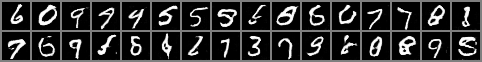

[3/5][1200/1875][209.0565 s]	Loss_D: -89.7096	Loss_G: 148.2321


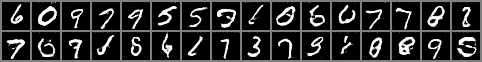

[3/5][1300/1875][213.1196 s]	Loss_D: -44.7194	Loss_G: 156.6462


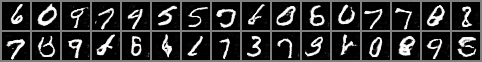

[3/5][1400/1875][217.3597 s]	Loss_D: -134.9355	Loss_G: 166.4166


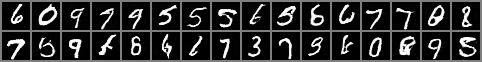

[3/5][1500/1875][221.5984 s]	Loss_D: -48.5670	Loss_G: 78.6762


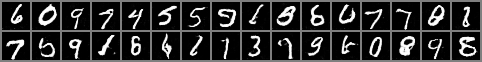

[3/5][1600/1875][225.6966 s]	Loss_D: 0.1881	Loss_G: 205.2855


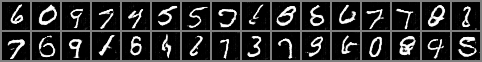

[3/5][1700/1875][229.9816 s]	Loss_D: -94.0765	Loss_G: 98.5928


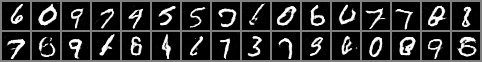

[3/5][1800/1875][234.1971 s]	Loss_D: -18.5513	Loss_G: 64.8598


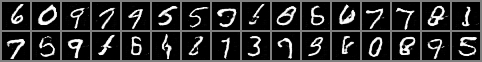

[4/5][0/1875][237.3880 s]	Loss_D: -9.2975	Loss_G: -3.4329


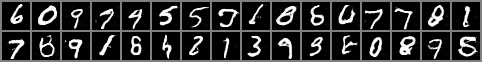

[4/5][100/1875][241.6255 s]	Loss_D: -7.9104	Loss_G: 503.4009


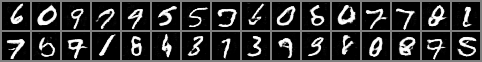

[4/5][200/1875][245.9436 s]	Loss_D: -43.4142	Loss_G: 373.6406


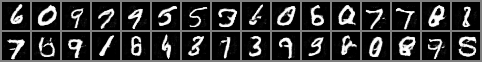

[4/5][300/1875][250.0834 s]	Loss_D: -14.9669	Loss_G: 165.9272


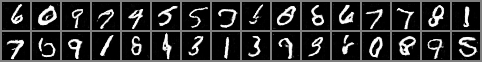

[4/5][400/1875][254.3540 s]	Loss_D: 18.0760	Loss_G: 135.9642


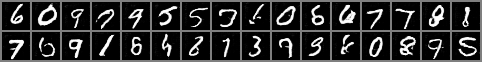

[4/5][500/1875][258.5745 s]	Loss_D: -97.1379	Loss_G: 375.8409


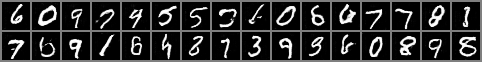

[4/5][600/1875][262.6966 s]	Loss_D: 47.5221	Loss_G: 137.6025


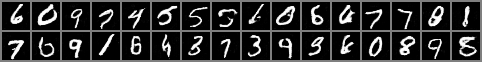

[4/5][700/1875][267.0114 s]	Loss_D: -32.3514	Loss_G: 202.1914


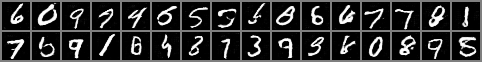

[4/5][800/1875][271.1720 s]	Loss_D: -98.9030	Loss_G: 133.7628


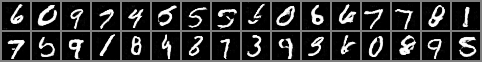

[4/5][900/1875][275.3115 s]	Loss_D: -16.1956	Loss_G: 403.6646


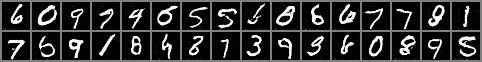

[4/5][1000/1875][279.6543 s]	Loss_D: -42.5375	Loss_G: 199.8880


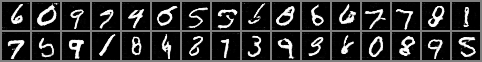

[4/5][1100/1875][283.7476 s]	Loss_D: -1.6707	Loss_G: 135.1250


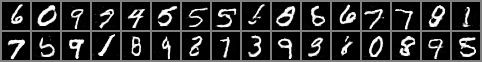

[4/5][1200/1875][287.8424 s]	Loss_D: 8.0900	Loss_G: 324.2383


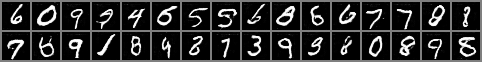

[4/5][1300/1875][292.2192 s]	Loss_D: -51.3045	Loss_G: 291.8406


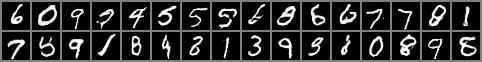

[4/5][1400/1875][296.3149 s]	Loss_D: -51.8163	Loss_G: 363.8813


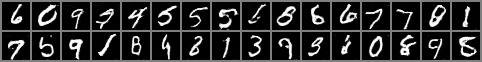

[4/5][1500/1875][300.4172 s]	Loss_D: 35.5026	Loss_G: 322.6861


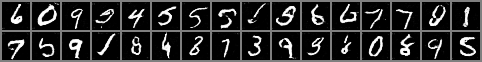

[4/5][1600/1875][304.7857 s]	Loss_D: -94.1117	Loss_G: 210.1854


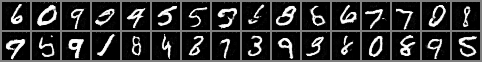

[4/5][1700/1875][308.8856 s]	Loss_D: -60.5872	Loss_G: 239.6656


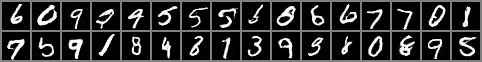

[4/5][1800/1875][312.9875 s]	Loss_D: -11.7076	Loss_G: 219.2916


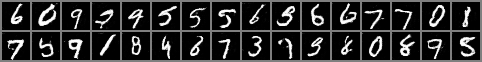

[5/5][0/1875][316.4267 s]	Loss_D: 1.9173	Loss_G: 258.3530


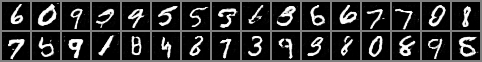

[5/5][100/1875][320.5473 s]	Loss_D: -8.9799	Loss_G: 222.6521


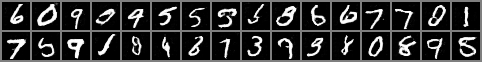

[5/5][200/1875][324.6236 s]	Loss_D: -5.5143	Loss_G: 170.5630


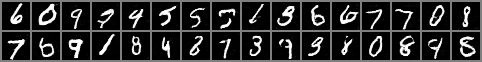

[5/5][300/1875][328.9931 s]	Loss_D: 17.7649	Loss_G: 299.5891


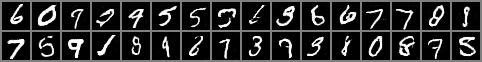

[5/5][400/1875][333.1206 s]	Loss_D: 3.7264	Loss_G: 222.8621


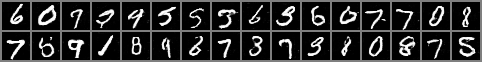

[5/5][500/1875][337.2665 s]	Loss_D: -22.7385	Loss_G: 643.4120


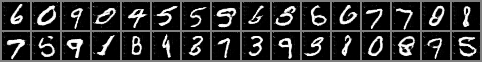

[5/5][600/1875][341.5996 s]	Loss_D: 0.0234	Loss_G: 450.2848


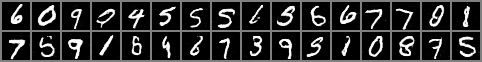

[5/5][700/1875][345.7224 s]	Loss_D: -61.0749	Loss_G: 291.8953


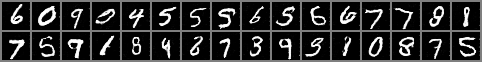

[5/5][800/1875][349.8196 s]	Loss_D: -53.3983	Loss_G: 279.7795


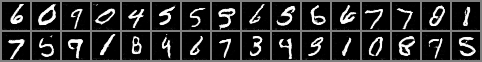

[5/5][900/1875][354.8477 s]	Loss_D: -32.9010	Loss_G: 359.8088


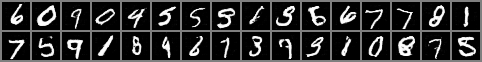

[5/5][1000/1875][358.9663 s]	Loss_D: 0.4939	Loss_G: 366.4627


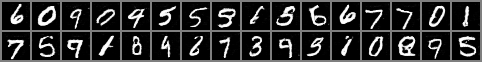

[5/5][1100/1875][363.1740 s]	Loss_D: 2.4337	Loss_G: 698.4462


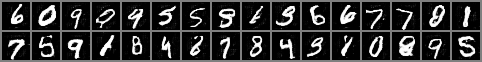

[5/5][1200/1875][367.5080 s]	Loss_D: -24.0046	Loss_G: 211.4005


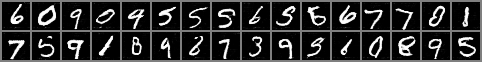

[5/5][1300/1875][371.6501 s]	Loss_D: -74.2099	Loss_G: 236.9829


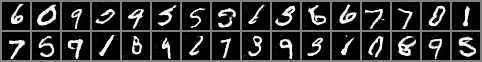

[5/5][1400/1875][375.9346 s]	Loss_D: -52.7819	Loss_G: 396.4982


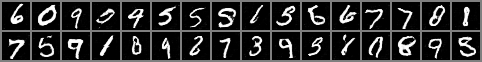

[5/5][1500/1875][380.1156 s]	Loss_D: -37.8087	Loss_G: 227.0806


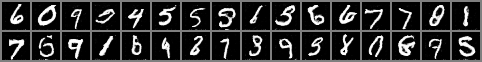

[5/5][1600/1875][384.1718 s]	Loss_D: 8.9703	Loss_G: 362.3073


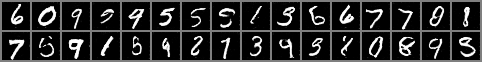

[5/5][1700/1875][388.4709 s]	Loss_D: -34.5143	Loss_G: 263.2857


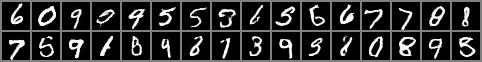

[5/5][1800/1875][392.6187 s]	Loss_D: -49.5734	Loss_G: 569.2029


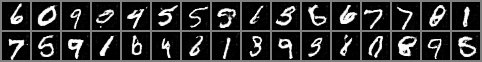

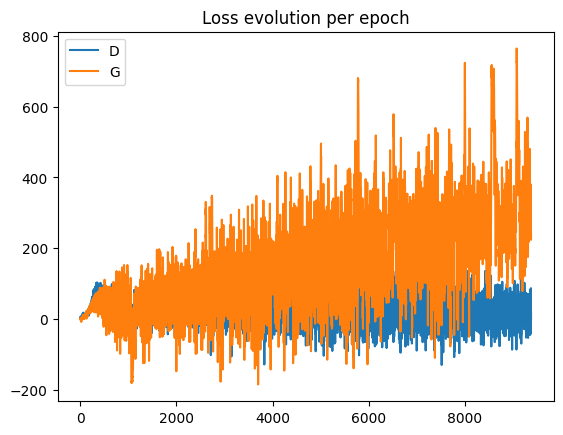

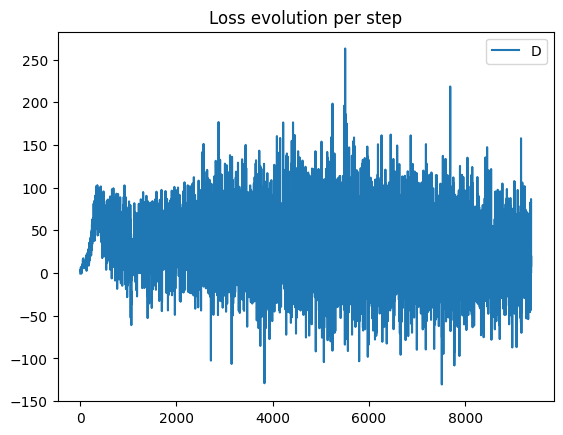

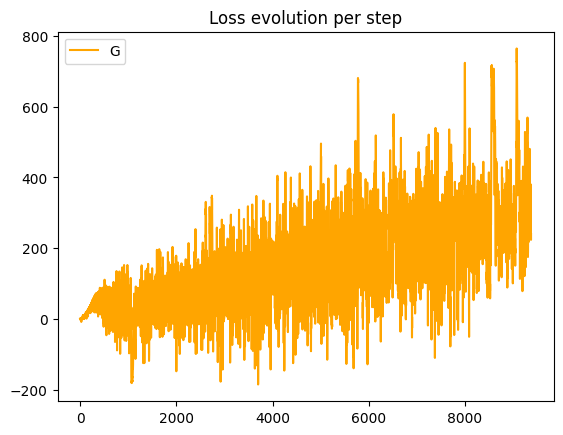

In [37]:
train_loader = DataLoader(train_set_MNIST, batch_size=batch_size, shuffle=True, num_workers = 2, drop_last=True)

G_WGAN_3D = Generator_3D(nz, ngf).to(device)
D_WGAN_3D = DWGAN_3D(ndf).to(device)

adversarial_training_3D(G_WGAN_3D,D_WGAN_3D,n_epochs, lrG, lrD, niterG, niterD, beta1, beta2, train_loader, batch_size, nz, loss = "wgan-gp", gradient_penalty_weight = gradient_penalty_weight)

##### VAE

In [38]:
class Encoder_3D(nn.Module):
    """
    Encoder architecture for the VAE 3D data
    """
    def __init__(self, n_in, n_hidden, n_out, device=torch.device("cpu")):
        super(Encoder_3D, self).__init__()
        self.n_in = n_in
        self.layers = nn.Sequential(
            nn.Linear(n_in, n_hidden),
            nn.LeakyReLU(0.2),
            nn.Linear(n_hidden, n_out),
            nn.LeakyReLU(0.2)
            ).to(device)

    def forward(self, x):
        x = self.layers(x)
        return x


In [39]:
#Decoder
class Decoder_3D(nn.Module):
    """
    Encoder architecture for the 3D VAE
    """
    def __init__(self, latent_dim, hidden_dim_1, hidden_dim_2, output_dim, device=torch.device("cpu")):
        super(Decoder_3D, self).__init__()
        self.layers =nn.Sequential(
            nn.Linear(latent_dim, hidden_dim_1),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim_1, hidden_dim_2),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim_2, output_dim),
            nn.Sigmoid()
            ).to(device)

    def forward(self, x):
        x = self.layers(x)
        return x


Epoch: 0001, Train Loss: 0.94641, Train Reconstruction Loss: 0.94135, Train KLD Loss: 506.09636


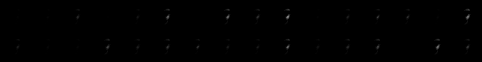

Epoch: 0002, Train Loss: 0.92367, Train Reconstruction Loss: 0.92258, Train KLD Loss: 108.73177


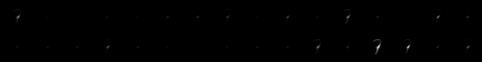

Epoch: 0003, Train Loss: 0.92308, Train Reconstruction Loss: 0.92162, Train KLD Loss: 145.37524


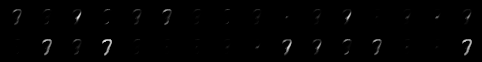

Epoch: 0004, Train Loss: 0.92072, Train Reconstruction Loss: 0.91799, Train KLD Loss: 273.13432


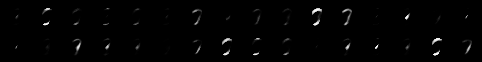

Epoch: 0005, Train Loss: 0.91746, Train Reconstruction Loss: 0.91348, Train KLD Loss: 398.26771


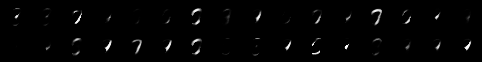

Epoch: 0006, Train Loss: 0.91556, Train Reconstruction Loss: 0.91078, Train KLD Loss: 478.38423


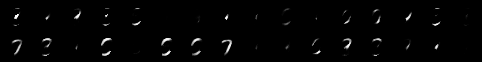

Epoch: 0007, Train Loss: 0.91418, Train Reconstruction Loss: 0.90874, Train KLD Loss: 544.47843


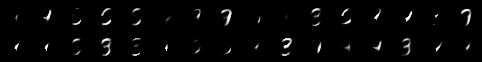

Epoch: 0008, Train Loss: 0.91304, Train Reconstruction Loss: 0.90676, Train KLD Loss: 627.85617


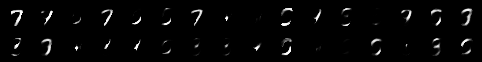

Epoch: 0009, Train Loss: 0.91171, Train Reconstruction Loss: 0.90455, Train KLD Loss: 716.00368


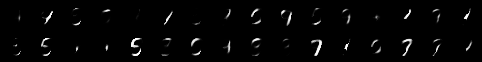

Epoch: 0010, Train Loss: 0.91046, Train Reconstruction Loss: 0.90253, Train KLD Loss: 793.18067


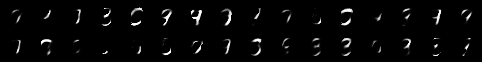

Epoch: 0011, Train Loss: 0.90874, Train Reconstruction Loss: 0.89974, Train KLD Loss: 900.18920


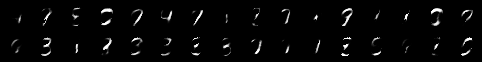

Epoch: 0012, Train Loss: 0.90712, Train Reconstruction Loss: 0.89718, Train KLD Loss: 994.23421


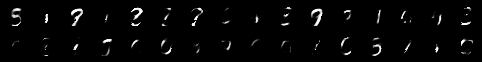

Epoch: 0013, Train Loss: 0.90515, Train Reconstruction Loss: 0.89428, Train KLD Loss: 1086.62238


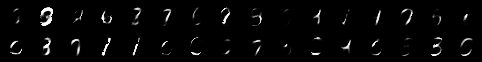

Epoch: 0014, Train Loss: 0.90313, Train Reconstruction Loss: 0.89149, Train KLD Loss: 1163.51719


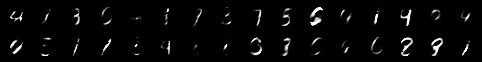

Epoch: 0015, Train Loss: 0.90184, Train Reconstruction Loss: 0.88963, Train KLD Loss: 1220.39169


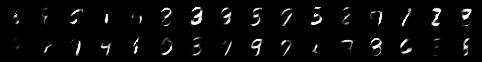

Epoch: 0016, Train Loss: 0.90072, Train Reconstruction Loss: 0.88811, Train KLD Loss: 1260.99150


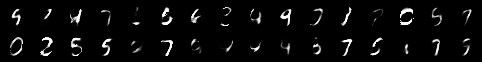

Epoch: 0017, Train Loss: 0.89951, Train Reconstruction Loss: 0.88652, Train KLD Loss: 1298.46110


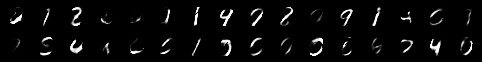

Epoch: 0018, Train Loss: 0.89845, Train Reconstruction Loss: 0.88514, Train KLD Loss: 1330.25844


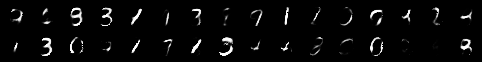

Epoch: 0019, Train Loss: 0.89762, Train Reconstruction Loss: 0.88404, Train KLD Loss: 1357.92656


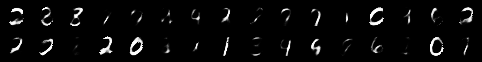

Epoch: 0020, Train Loss: 0.89675, Train Reconstruction Loss: 0.88292, Train KLD Loss: 1382.92019


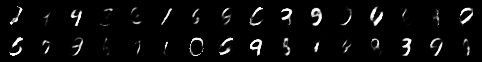

Epoch: 0021, Train Loss: 0.89613, Train Reconstruction Loss: 0.88212, Train KLD Loss: 1400.49698


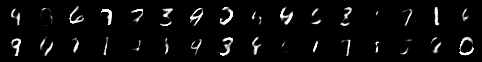

Epoch: 0022, Train Loss: 0.89573, Train Reconstruction Loss: 0.88154, Train KLD Loss: 1418.12975


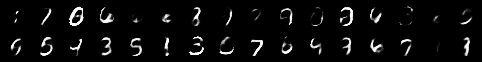

Epoch: 0023, Train Loss: 0.89520, Train Reconstruction Loss: 0.88090, Train KLD Loss: 1430.31831


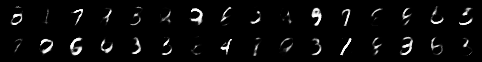

Epoch: 0024, Train Loss: 0.89472, Train Reconstruction Loss: 0.88026, Train KLD Loss: 1446.47811


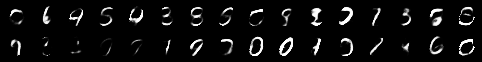

Epoch: 0025, Train Loss: 0.89429, Train Reconstruction Loss: 0.87972, Train KLD Loss: 1457.19231


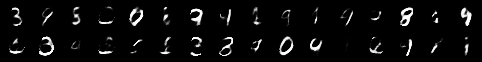

Epoch: 0026, Train Loss: 0.89390, Train Reconstruction Loss: 0.87915, Train KLD Loss: 1474.47944


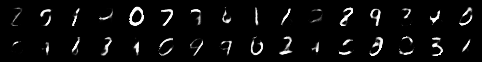

Epoch: 0027, Train Loss: 0.89346, Train Reconstruction Loss: 0.87862, Train KLD Loss: 1484.26724


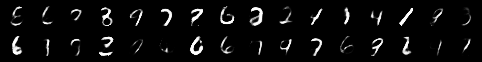

Epoch: 0028, Train Loss: 0.89300, Train Reconstruction Loss: 0.87802, Train KLD Loss: 1498.47005


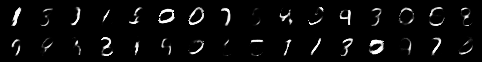

Epoch: 0029, Train Loss: 0.89262, Train Reconstruction Loss: 0.87756, Train KLD Loss: 1506.56634


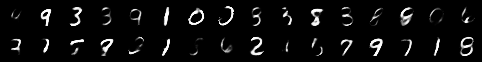

Epoch: 0030, Train Loss: 0.89223, Train Reconstruction Loss: 0.87707, Train KLD Loss: 1515.76312


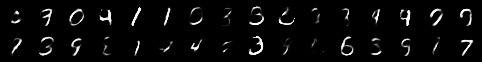

Epoch: 0031, Train Loss: 0.89198, Train Reconstruction Loss: 0.87670, Train KLD Loss: 1527.72707


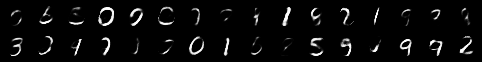

Epoch: 0032, Train Loss: 0.89165, Train Reconstruction Loss: 0.87629, Train KLD Loss: 1536.68848


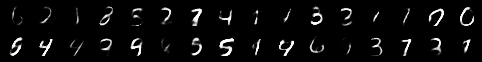

Epoch: 0033, Train Loss: 0.89145, Train Reconstruction Loss: 0.87602, Train KLD Loss: 1543.07694


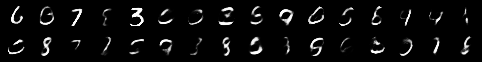

Epoch: 0034, Train Loss: 0.89119, Train Reconstruction Loss: 0.87567, Train KLD Loss: 1551.46135


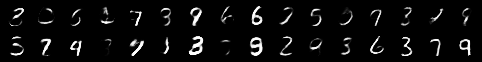

Epoch: 0035, Train Loss: 0.89097, Train Reconstruction Loss: 0.87541, Train KLD Loss: 1555.52248


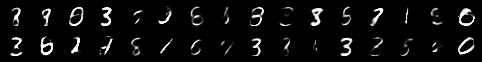

Epoch: 0036, Train Loss: 0.89081, Train Reconstruction Loss: 0.87518, Train KLD Loss: 1563.25086


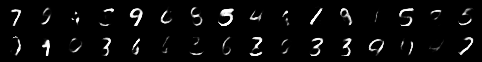

Epoch: 0037, Train Loss: 0.89057, Train Reconstruction Loss: 0.87488, Train KLD Loss: 1568.82492


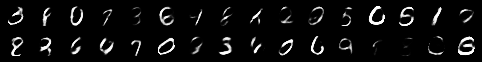

Epoch: 0038, Train Loss: 0.89048, Train Reconstruction Loss: 0.87471, Train KLD Loss: 1577.18977


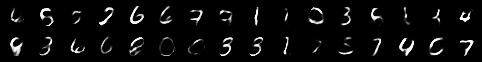

Epoch: 0039, Train Loss: 0.89031, Train Reconstruction Loss: 0.87448, Train KLD Loss: 1583.01335


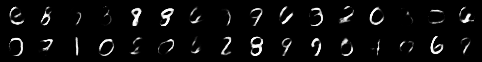

Epoch: 0040, Train Loss: 0.89008, Train Reconstruction Loss: 0.87415, Train KLD Loss: 1592.98037


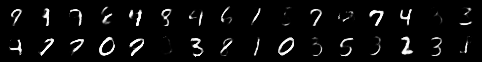

Epoch: 0041, Train Loss: 0.88990, Train Reconstruction Loss: 0.87390, Train KLD Loss: 1600.24548


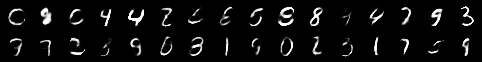

Epoch: 0042, Train Loss: 0.88980, Train Reconstruction Loss: 0.87371, Train KLD Loss: 1608.69591


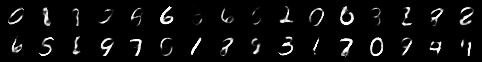

Epoch: 0043, Train Loss: 0.88965, Train Reconstruction Loss: 0.87348, Train KLD Loss: 1617.39649


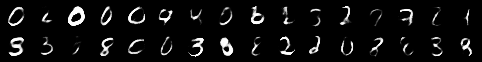

Epoch: 0044, Train Loss: 0.88945, Train Reconstruction Loss: 0.87323, Train KLD Loss: 1621.72730


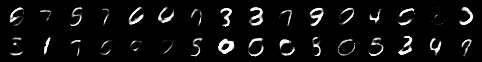

Epoch: 0045, Train Loss: 0.88928, Train Reconstruction Loss: 0.87297, Train KLD Loss: 1631.41448


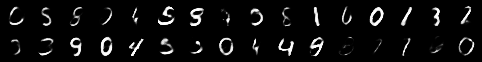

Epoch: 0046, Train Loss: 0.88913, Train Reconstruction Loss: 0.87282, Train KLD Loss: 1631.07535


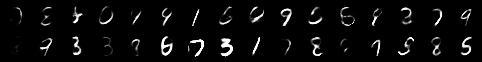

Epoch: 0047, Train Loss: 0.88905, Train Reconstruction Loss: 0.87266, Train KLD Loss: 1639.36912


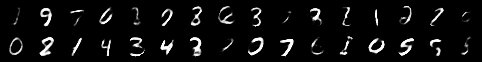

Epoch: 0048, Train Loss: 0.88898, Train Reconstruction Loss: 0.87252, Train KLD Loss: 1645.72878


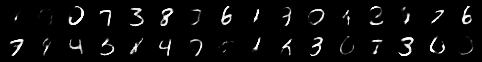

Epoch: 0049, Train Loss: 0.88885, Train Reconstruction Loss: 0.87239, Train KLD Loss: 1645.84129


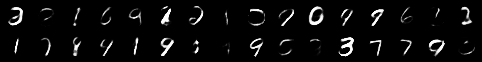

Epoch: 0050, Train Loss: 0.88880, Train Reconstruction Loss: 0.87228, Train KLD Loss: 1651.74987


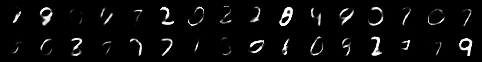

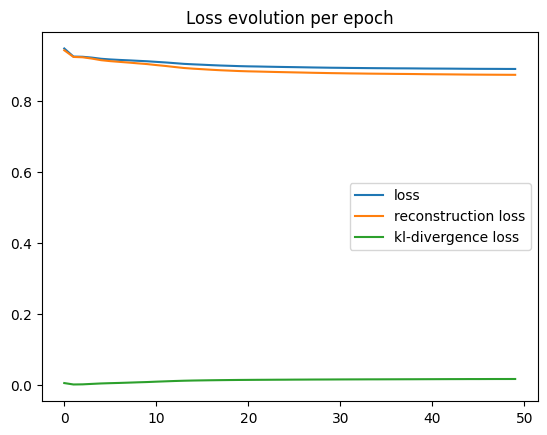

In [40]:
train_loader_MNIST = DataLoader(train_set_MNIST, batch_size=128, shuffle=True, num_workers = 2, drop_last=True)

hidden_dim_enc = 256
output_dim_enc = 128
latent_dim = 32
output_dim = 28*28

encoder = Encoder_3D(output_dim, hidden_dim_enc, output_dim_enc, device=device)
decoder = Decoder_3D(latent_dim, output_dim_enc, hidden_dim_enc, output_dim, device=device)
VAE_3D = VariationalAutoEncoder(encoder, decoder, output_dim_enc, latent_dim).to(device)

n_epochs = 50
lr = 0.001
beta = 1e-5

vae_training(VAE_3D, n_epochs, lr, train_loader_MNIST, beta, iter_display = 1)

#### 3.a. Comment on the quality of generated images with these two networks.

In [41]:
batch_size = 32

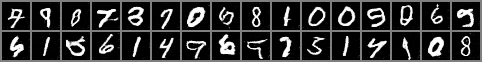

In [42]:
#WGAN
z_vizualization = torch.randn(batch_size, nz, 1, 1).to(device)
show(G_WGAN_3D, z_vizualization, batch_size)

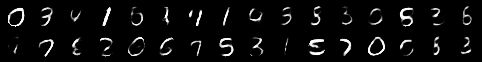

In [43]:
#VAE
z = torch.randn(batch_size, VAE_3D.latent_dim, device=device)
x = VAE_3D.decode_mu(z)
xd = x.detach().squeeze(1)
xd = xd.view(-1, 1, 28, 28)
pil_img = transforms.functional.to_pil_image(make_grid(xd.to('cpu'),nrow=16))
display(pil_img)

The WGAN model seems to give better results. Indeed, it's easier to identify which number the generated samples should correspond with WGAN than with the VAE model. The line thickness is bigger with WGAN, which makes the generation more realistic and readable. However, sometimes for both models, we can hesitate between several numbers for one image. Moreover, it seems that there is more diversity for the WGAN model than for the VAE: we can observe several MNIST classes for the WGAN while we mostly observe 0, 1, and 2 for the VAE (it depends on the training).

#### 3.b. Is there one of these learning strategies that you would favor? Why?

WGAN might be preferred if sharper images and better sample quality are desired since it tends to handle sharpness and detail better. VAE is more suitable if interpretability is priorities since it provides a clearer representation of the latent space. By knowing the representation of the latent space, we can do interpolation between to images for example.

### 4. For (MNIST-data), you will design one quantitative criterion to evaluate the performance of a generative network.

#### 4.a. Is the Fréchet inception distance (FID) appropriate to evaluate the performance of such generative networks? If not, can you propose an adaptation?

Fréchet Inception Distance (FID) measures the difference between the real and generated distribution in feature space, using the Inception network for feature extraction. While it is useful for comparing distributions of images, it may not fully capture the diversity of the generated dataset or distinguish between subtle differences. Moreover, the FID has a highly computational cost. Indeed, we need to load the Inception network and compute the images features, which is very long and should also be done on huge amount of images (this implicates we also generate lot of images). This could be useful for complex images. However in our case with a simple dataset like MNSIT, we maybe could replace the big Inception network by a simpler MNIST-specific feature extraction network.

#### 4.b. Propose a quantitative criterion that assesses the fact that the 10 classes of MNIST (corresponding to each figure between 0 and 9) are well represented by the generative network.

A good metric for MNIST could be a metric ensuring that all 10 digits are generated as much as possible in a uniformly distributed manner by the model. A possible criterion could be the entropy of the class labels assigned by a classifier (a pretrained model with classification task on MNSIT as objective) to the generated data. Higher entropy would indicate better class diversity.

#### 4.c. Comment on the benefits and drawbacks of the quantitative criteria discussed in 4a and 4b.

- FID:

  - Benefits:
    - FID is widely used (comparison with other methods/papers)
    - Can capture the overall similarity between the generated and real image distributions.

  - Drawbacks:
    - It does not directly evaluate diversity within the generated samples, particularly class-wise diversity for MNIST.
    - It cannot capture the novelty or the uniqueness: it can be, for example, useful for the generation of new molecules (not really images) with the goal of drug discovery. Indeed, we want to generate unknown molecules and, as much as possible, not to have some repetitions in the generated data.
    - High computational costs

- Entropy loss:
  - Benefits:
    - Ensures that all classes are represented uniformly, directly addressing whether the generative model is producing a balanced set of outputs across all digits.
  - Drawbacks:
    - It might not take into account the quality of generated images within each class.
    - We need a good classsifier to avoid missclassified samples.